<a href="https://colab.research.google.com/github/dauparas/tensorflow_examples/blob/master/VAE_with_latent_subspaces_swiss_roll.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Variational Autoencoder Model (VAE) with latent subspaces based on:
https://arxiv.org/pdf/1812.06190.pdf

In [0]:
#Step 1: import dependencies
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from keras import regularizers
import time
from __future__ import division

import tensorflow as tf
import tensorflow_probability as tfp
tfd = tfp.distributions

%matplotlib inline
plt.style.use('dark_background')

import pandas as pd

In [0]:
from sklearn.datasets.samples_generator import make_swiss_roll
n_samples = 1000
noise = 0.05
X, t = make_swiss_roll(n_samples, noise)
# Make it thinner
X[:, 1] *= .5

In [0]:
U = np.reshape(t, [-1,1])

In [0]:
from sklearn.datasets.samples_generator import make_blobs
X, Y = make_blobs(n_samples=5000, centers=15, n_features=64,random_state=0)
data_variance = np.var(X)
X = (X-np.mean(X, axis=0))/np.std(X, axis=0)

In [389]:
X.shape

(5000, 64)

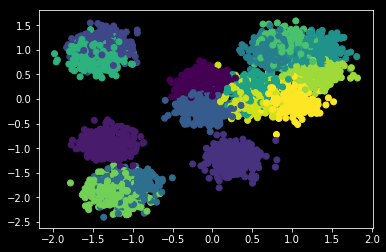

In [390]:
plt.scatter(X[:,0], X[:,1], c=Y)

In [0]:
U = np.random.uniform(0, 1, 5000)
X1 = X[:,0:50]+0.1*U[:,np.newaxis]
X2 = 0.01*X[:,50:]+(0.0+1.3*U[:,np.newaxis])

In [0]:
X_new = np.concatenate((X1, X2), axis=-1)

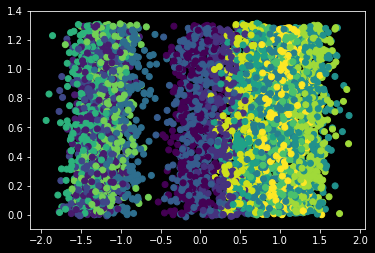

In [393]:
plt.scatter(X_new[:,0], X_new[:,51], c=Y)

In [0]:
X=X_new

In [0]:
U = U[:,np.newaxis]

In [0]:
#Reconstruction loss
def x_given_w_z(w, z, output_size):
  with tf.variable_scope('M/x_given_w_z'):
    act = tf.nn.leaky_relu
    
    h = tf.concat((w,z), axis=-1)
    h = tf.layers.dense(h, 8, act)
    h = tf.layers.dense(h, 16, act)
    h = tf.layers.dense(h, 32, act)
    h = tf.layers.dense(h, 64, act)
    loc = tf.layers.dense(h, output_size)
    #log_variance = tf.layers.dense(x, latent_size)
    #scale = tf.nn.softplus(log_variance)
    scale = 0.01*tf.ones(tf.shape(loc))
    return tfd.MultivariateNormalDiag(loc, scale)


#KL term for w
def w_given_x_y(x, y, latent_size): #+
  with tf.variable_scope('M/w_given_x_y'):
    act = tf.nn.leaky_relu
    h = tf.concat((x,y), axis=-1)
    
    h = tf.layers.dense(h, 64, act)
    h = tf.layers.dense(h, 32, act)
    h = tf.layers.dense(h, 16, act)
    h = tf.layers.dense(h, 8, act)
    
    loc = tf.layers.dense(h,latent_size)
    log_variance = tf.layers.dense(h, latent_size)
    scale = tf.nn.softplus(log_variance)
    #scale = 0.01*tf.ones(tf.shape(loc))
    return tfd.MultivariateNormalDiag(loc, scale)

def w_given_y(y, y_size):
  with tf.variable_scope('M/w_given_y'):
    act = tf.nn.leaky_relu
    h = y
    
    h = tf.layers.dense(h, 64, act)
    h = tf.layers.dense(h, 32, act)
    h = tf.layers.dense(h, 16, act)
    h = tf.layers.dense(h, 8, act)
    
    loc = tf.layers.dense(h, y_size)
    log_variance = tf.layers.dense(h, y_size)
    scale = tf.nn.softplus(log_variance)
    return tfd.MultivariateNormalDiag(loc, scale)


#KL term for z
def z_given_x(x, latent_size): #+
  with tf.variable_scope('M/z_given_x'):
    act = tf.nn.leaky_relu
    h = x
    
    h = tf.layers.dense(h, 64, act)
    h = tf.layers.dense(h, 32, act)
    h = tf.layers.dense(h, 16, act)
    h = tf.layers.dense(h, 8, act)
    
    loc = tf.layers.dense(h,latent_size)
    log_variance = tf.layers.dense(h, latent_size)
    scale = tf.nn.softplus(log_variance)
#     scale = 0.01*tf.ones(tf.shape(loc))
    return tfd.MultivariateNormalDiag(loc, scale)

def z_given(latent_size):
  with tf.variable_scope('M/z_given'):
    loc = tf.zeros(latent_size)
    scale = 0.1*tf.ones(tf.shape(loc))
    return tfd.MultivariateNormalDiag(loc, scale)


#For the Mutual information term
def y_given_z(z, y_size, reuse=None):
  with tf.variable_scope('N', reuse=reuse):
    act = tf.nn.leaky_relu
    h = z
    
    h = tf.layers.dense(h, 64, act)
    h = tf.layers.dense(h, 32, act)
    h = tf.layers.dense(h, 16, act)
    h = tf.layers.dense(h, 8, act)
    
    loc = tf.layers.dense(h, y_size)
    log_variance = tf.layers.dense(h, y_size)
    scale = tf.nn.softplus(log_variance)
    #scale = 0.01*tf.ones(tf.shape(loc))
    return tfd.MultivariateNormalDiag(loc, scale)

In [0]:
#Connect encoder and decoder and define the loss function
tf.reset_default_graph()

x_in = tf.placeholder(tf.float32, shape=[None, X.shape[1]], name='x_in')
x_out = tf.placeholder(tf.float32, shape=[None, X.shape[1]], name='x_out')
u_in = tf.placeholder(tf.float32, shape=[None, 1], name='u_in')


#beta = np.array([1.0, 0.1, 0.001, 4.0, 4.0])
beta = np.array([20.0, 3.0, 0.01, 20.0, 1.0])

z_latent_size = 2
w_latent_size = 1

M_learning_rate = 1e-4
N_learning_rate = 1e-4

#KL_w
wIy = w_given_y(u_in, w_latent_size)
wIxy = w_given_x_y(x_in, u_in, w_latent_size)
wIxy_sample = wIxy.sample()
wIxy_mean = wIxy.mean()
kl_w = tf.reduce_mean(wIxy.log_prob(wIxy_sample)- wIy.log_prob(wIxy_sample))

#KL_z
zI = z_given(z_latent_size)
zIx = z_given_x(x_in, z_latent_size)
zIx_sample = zIx.sample()
zIx_mean = zIx.mean()
kl_z = tf.reduce_mean(zIx.log_prob(zIx_sample)- zI.log_prob(zIx_sample))

#Reconstruction
xIwz = x_given_w_z(wIxy_sample, zIx_sample, X.shape[1])
rec_out = xIwz.mean()
rec_loss = tf.losses.mean_squared_error(x_out, rec_out)

M1 = beta[0]*rec_loss + beta[1]*kl_w + beta[2]*kl_z

yIz = y_given_z(zIx_sample, U.shape[1], reuse=False)
ent2 = -tf.reduce_mean(yIz.entropy())
M2 = beta[3]*ent2

M_cost = M1 + M2

M_optimizer = tf.train.AdamOptimizer(M_learning_rate)

M_train_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='M/')
M_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='M/')

with tf.control_dependencies(M_update_ops):
  M_train = M_optimizer.minimize(M_cost, var_list=M_train_vars,
                                       name='train_M')

  
yIz_N = y_given_z(zIx_sample, U.shape[1], reuse=True)
logN = tf.reduce_mean(-yIz_N.log_prob(u_in))
N = beta[4]*logN

N_cost = N

N_optimizer = tf.train.AdamOptimizer(N_learning_rate)

N_train_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='N')
N_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='N')

with tf.control_dependencies(N_update_ops):
  N_train = N_optimizer.minimize(N_cost, var_list=N_train_vars,
                                       name='train_N')

# Saver to save session for reuse
saver = tf.train.Saver()

In [0]:
#Helper function
def batch_generator(features, x, u, batch_size):
  """Function to create python generator to shuffle and split features into batches along the first dimension."""
  idx = np.arange(features.shape[0])
  np.random.shuffle(idx)
  for start_idx in range(0, features.shape[0], batch_size):
    end_idx = min(start_idx + batch_size, features.shape[0])
    part = idx[start_idx:end_idx]
    yield features[part,:], x[part,:] , u[part, :]

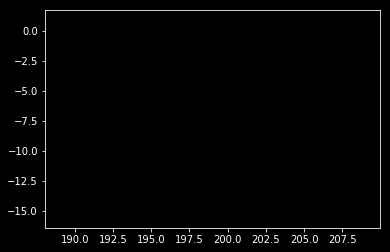

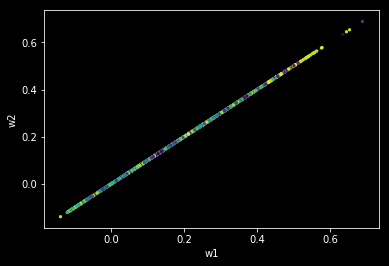

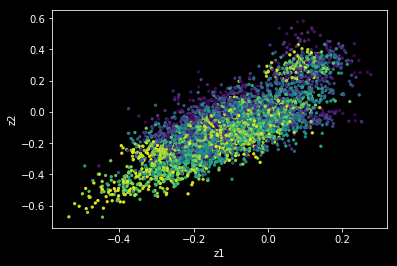

epoch: 200, M_loss: 2.2, M1_loss: 17.8, M2_loss: -15.6, N_loss: 0.455
epoch: 200, rec_loss: 0.880, kl_w: 0.04, kl_z: 6.77


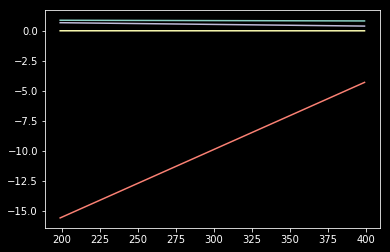

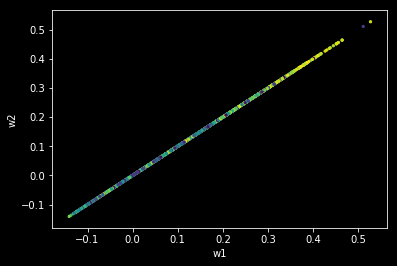

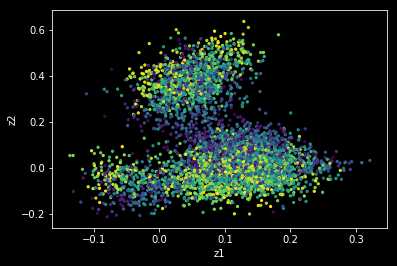

epoch: 400, M_loss: 12.2, M1_loss: 16.5, M2_loss: -4.3, N_loss: 0.184
epoch: 400, rec_loss: 0.822, kl_w: 0.01, kl_z: 3.95


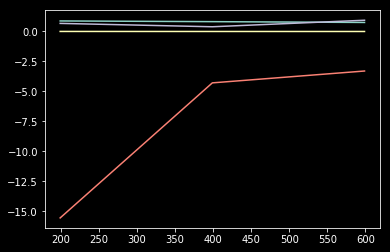

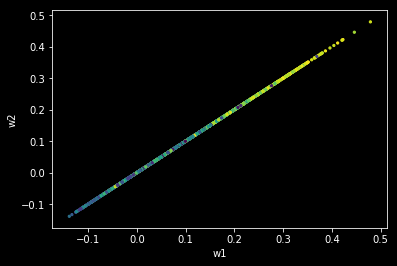

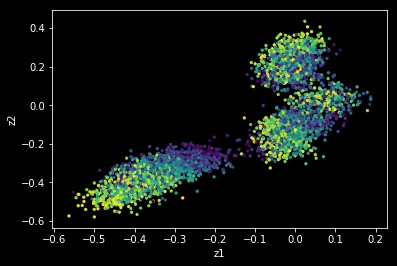

epoch: 600, M_loss: 11.9, M1_loss: 15.2, M2_loss: -3.3, N_loss: 0.165
epoch: 600, rec_loss: 0.755, kl_w: 0.01, kl_z: 9.39


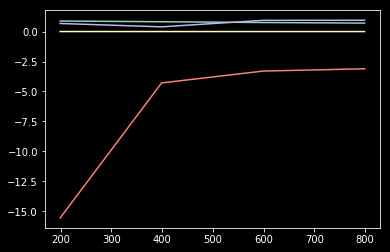

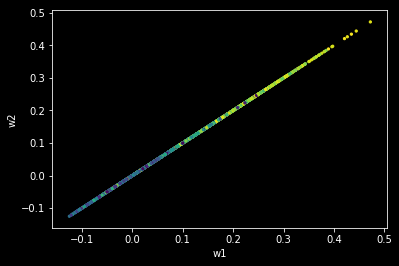

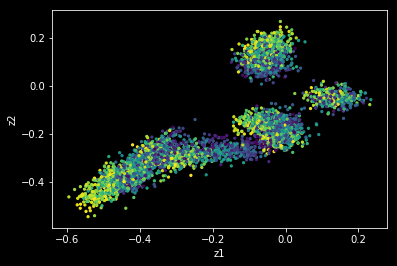

epoch: 800, M_loss: 11.2, M1_loss: 14.3, M2_loss: -3.1, N_loss: 0.159
epoch: 800, rec_loss: 0.708, kl_w: 0.01, kl_z: 9.46


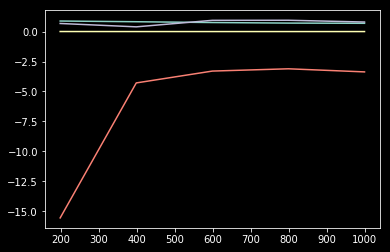

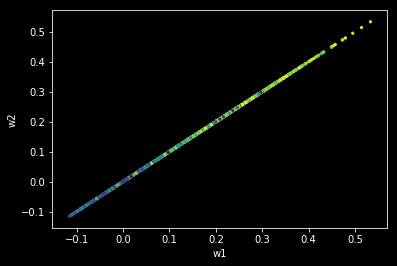

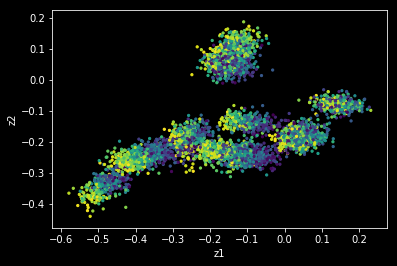

epoch: 1000, M_loss: 10.6, M1_loss: 13.9, M2_loss: -3.4, N_loss: 0.169
epoch: 1000, rec_loss: 0.691, kl_w: 0.01, kl_z: 7.97


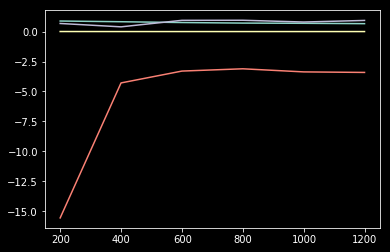

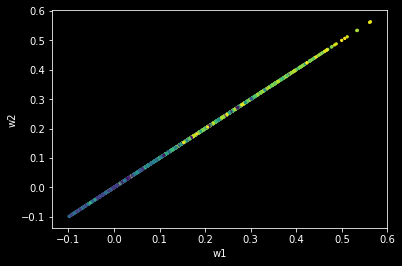

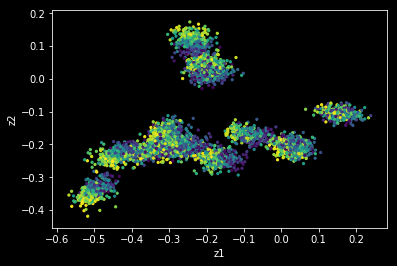

epoch: 1200, M_loss: 9.9, M1_loss: 13.3, M2_loss: -3.4, N_loss: 0.172
epoch: 1200, rec_loss: 0.660, kl_w: 0.01, kl_z: 9.31


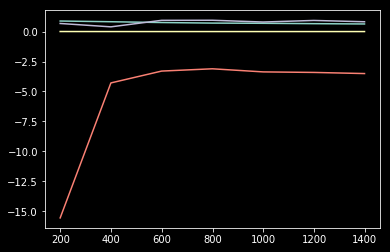

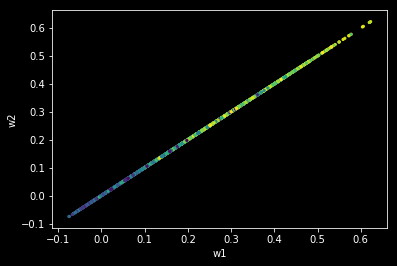

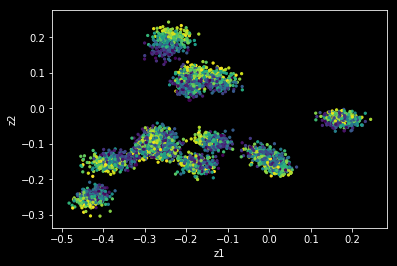

epoch: 1400, M_loss: 9.3, M1_loss: 12.8, M2_loss: -3.5, N_loss: 0.173
epoch: 1400, rec_loss: 0.635, kl_w: 0.01, kl_z: 8.19


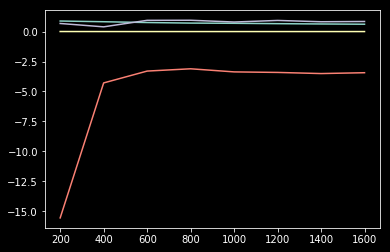

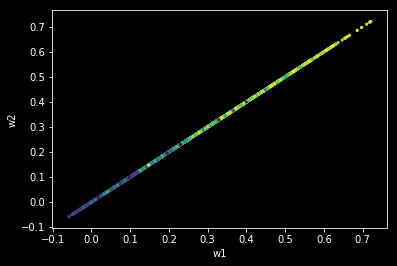

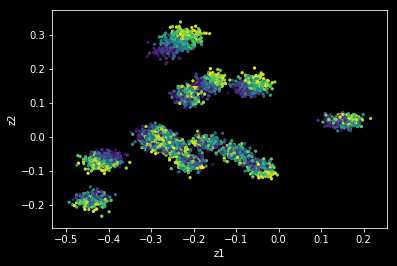

epoch: 1600, M_loss: 9.0, M1_loss: 12.4, M2_loss: -3.4, N_loss: 0.170
epoch: 1600, rec_loss: 0.614, kl_w: 0.01, kl_z: 8.43


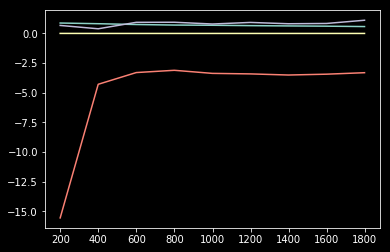

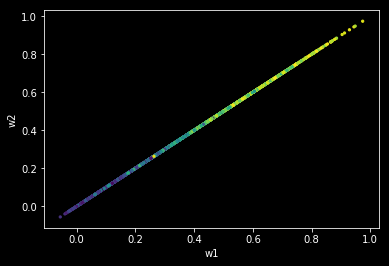

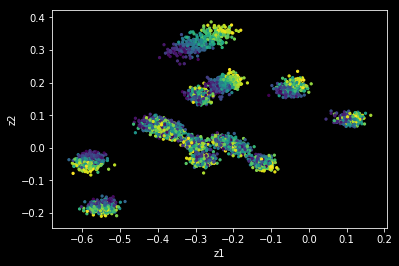

epoch: 1800, M_loss: 8.5, M1_loss: 11.8, M2_loss: -3.3, N_loss: 0.164
epoch: 1800, rec_loss: 0.582, kl_w: 0.01, kl_z: 11.15


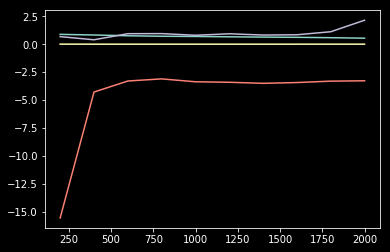

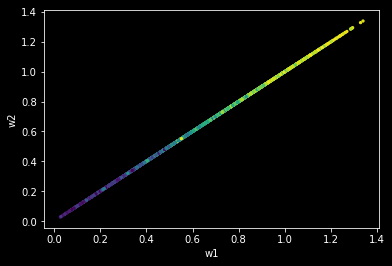

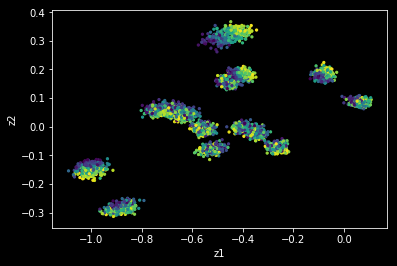

epoch: 2000, M_loss: 7.7, M1_loss: 11.0, M2_loss: -3.3, N_loss: 0.167
epoch: 2000, rec_loss: 0.538, kl_w: 0.02, kl_z: 21.44


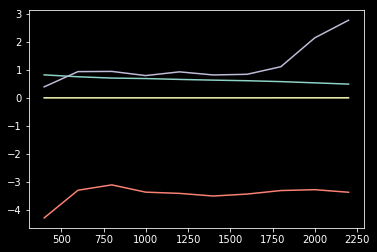

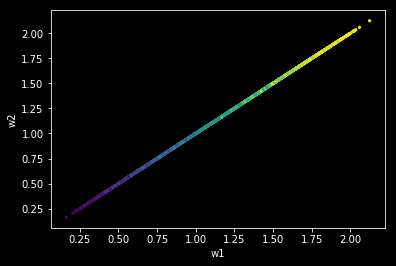

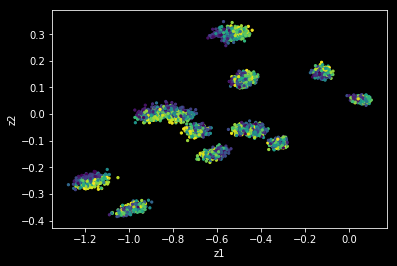

epoch: 2200, M_loss: 6.8, M1_loss: 10.2, M2_loss: -3.4, N_loss: 0.170
epoch: 2200, rec_loss: 0.493, kl_w: 0.02, kl_z: 27.74


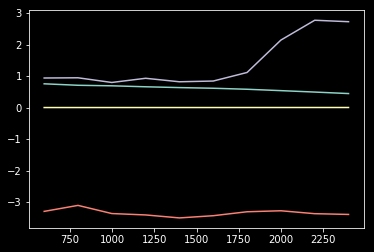

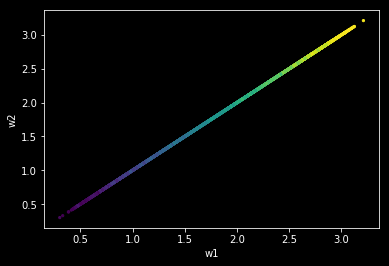

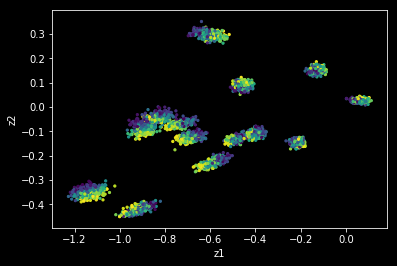

epoch: 2400, M_loss: 5.8, M1_loss: 9.2, M2_loss: -3.4, N_loss: 0.171
epoch: 2400, rec_loss: 0.445, kl_w: 0.02, kl_z: 27.28


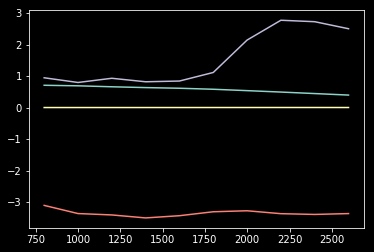

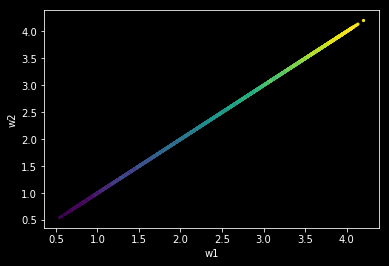

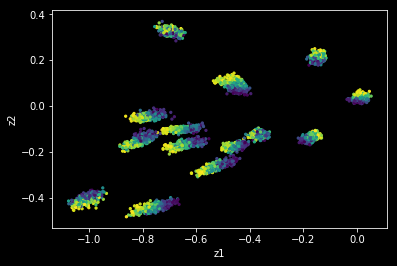

epoch: 2600, M_loss: 4.9, M1_loss: 8.2, M2_loss: -3.4, N_loss: 0.166
epoch: 2600, rec_loss: 0.397, kl_w: 0.02, kl_z: 25.05


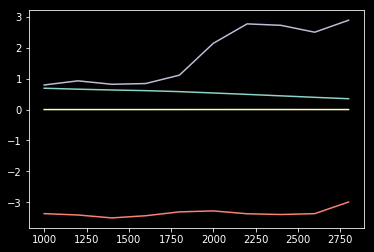

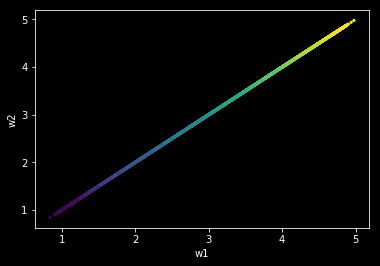

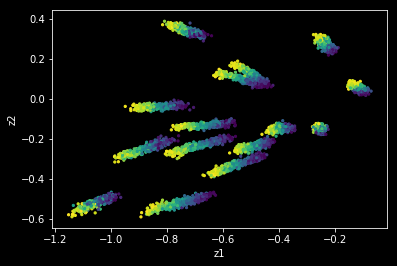

epoch: 2800, M_loss: 4.4, M1_loss: 7.4, M2_loss: -3.0, N_loss: 0.147
epoch: 2800, rec_loss: 0.352, kl_w: 0.02, kl_z: 28.92


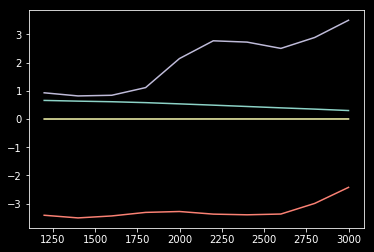

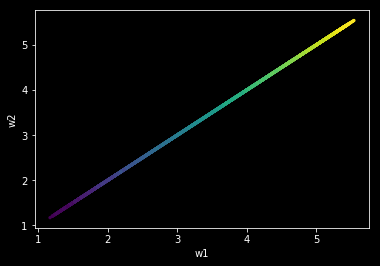

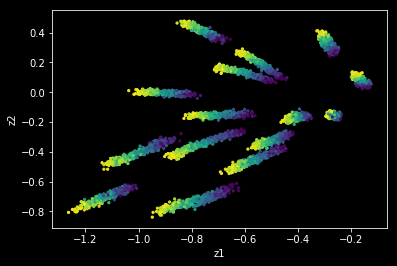

epoch: 3000, M_loss: 4.0, M1_loss: 6.4, M2_loss: -2.4, N_loss: 0.121
epoch: 3000, rec_loss: 0.301, kl_w: 0.02, kl_z: 35.03


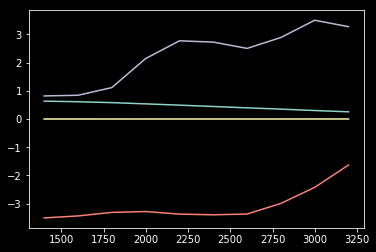

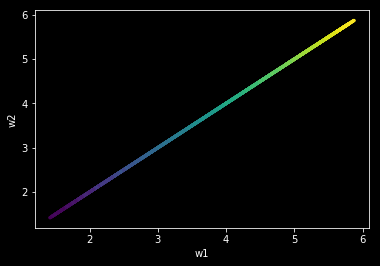

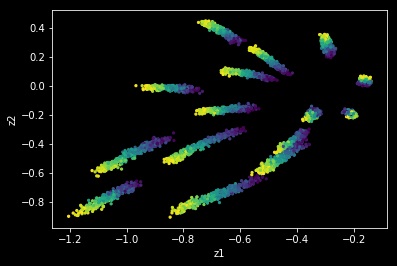

epoch: 3200, M_loss: 3.9, M1_loss: 5.5, M2_loss: -1.6, N_loss: 0.084
epoch: 3200, rec_loss: 0.256, kl_w: 0.02, kl_z: 32.75


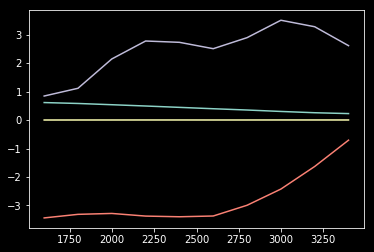

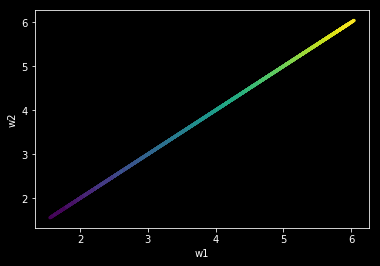

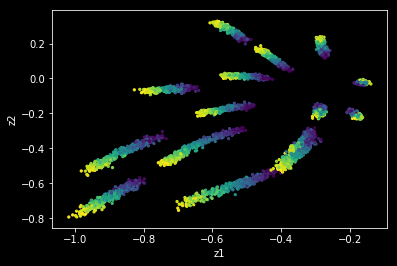

epoch: 3400, M_loss: 4.1, M1_loss: 4.8, M2_loss: -0.7, N_loss: 0.034
epoch: 3400, rec_loss: 0.226, kl_w: 0.02, kl_z: 26.11


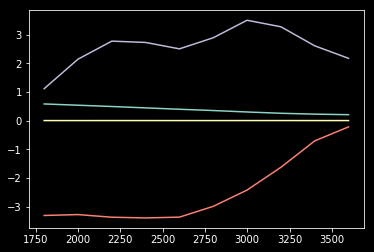

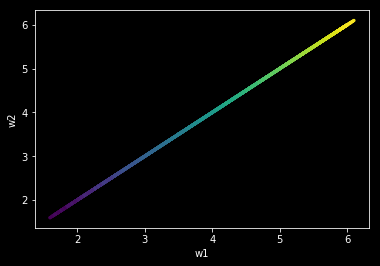

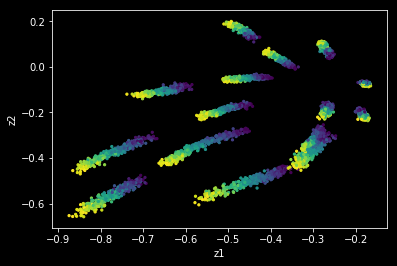

epoch: 3600, M_loss: 4.2, M1_loss: 4.4, M2_loss: -0.2, N_loss: 0.014
epoch: 3600, rec_loss: 0.207, kl_w: 0.02, kl_z: 21.74


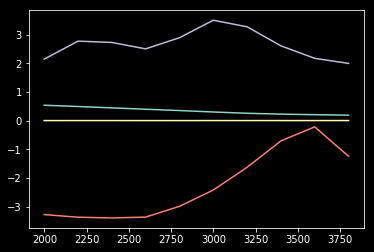

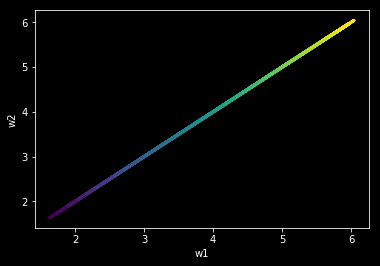

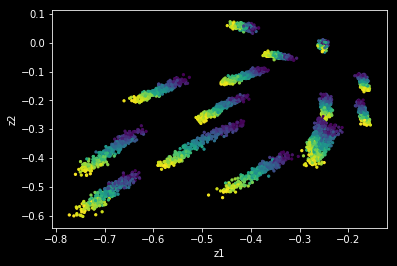

epoch: 3800, M_loss: 2.8, M1_loss: 4.1, M2_loss: -1.2, N_loss: 0.072
epoch: 3800, rec_loss: 0.190, kl_w: 0.02, kl_z: 19.98


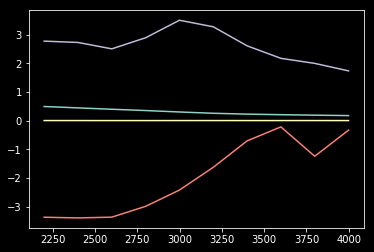

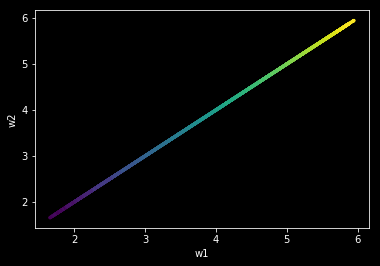

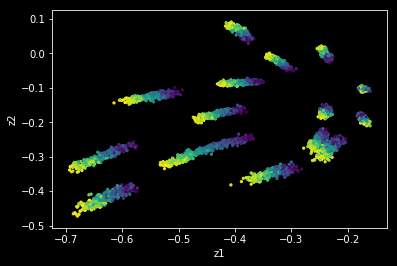

epoch: 4000, M_loss: 3.4, M1_loss: 3.7, M2_loss: -0.3, N_loss: 0.017
epoch: 4000, rec_loss: 0.175, kl_w: 0.02, kl_z: 17.36


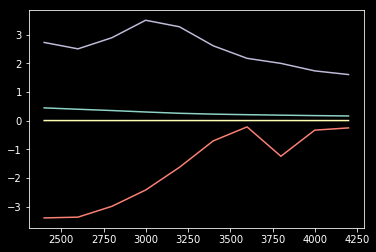

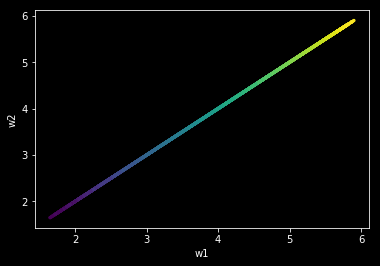

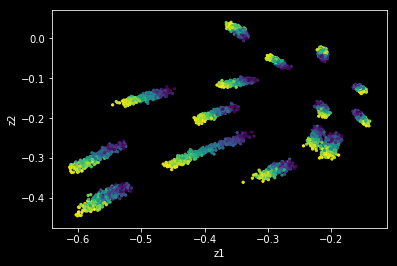

epoch: 4200, M_loss: 3.2, M1_loss: 3.5, M2_loss: -0.3, N_loss: 0.016
epoch: 4200, rec_loss: 0.163, kl_w: 0.02, kl_z: 16.08


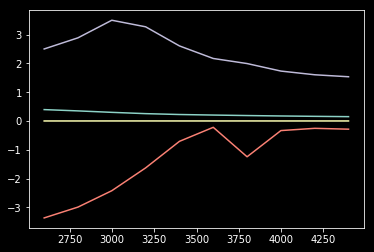

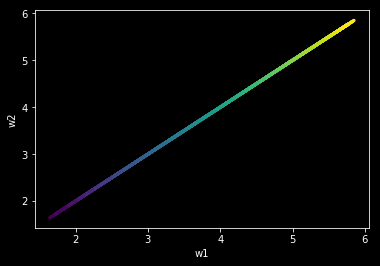

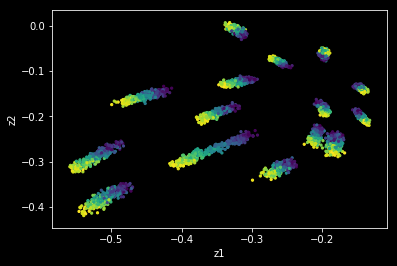

epoch: 4400, M_loss: 3.0, M1_loss: 3.2, M2_loss: -0.3, N_loss: 0.021
epoch: 4400, rec_loss: 0.151, kl_w: 0.02, kl_z: 15.39


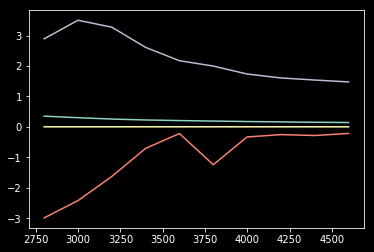

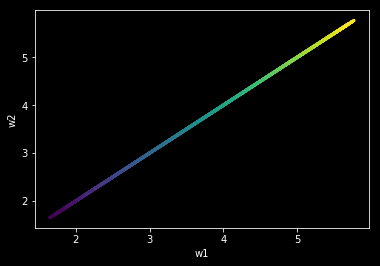

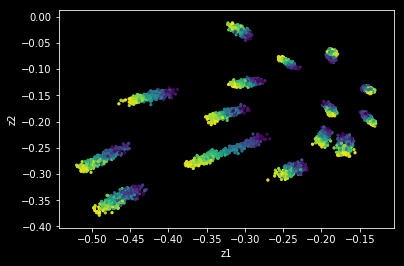

epoch: 4600, M_loss: 2.8, M1_loss: 3.1, M2_loss: -0.2, N_loss: 0.018
epoch: 4600, rec_loss: 0.143, kl_w: 0.02, kl_z: 14.77


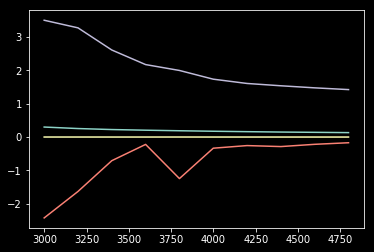

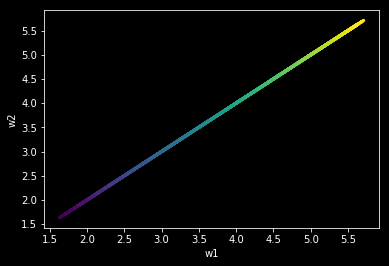

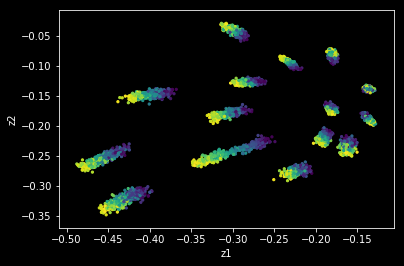

epoch: 4800, M_loss: 2.7, M1_loss: 2.9, M2_loss: -0.2, N_loss: 0.010
epoch: 4800, rec_loss: 0.134, kl_w: 0.02, kl_z: 14.24


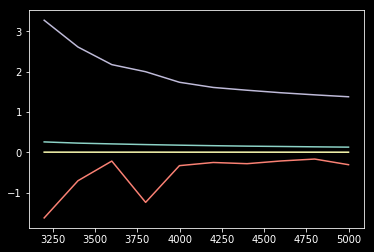

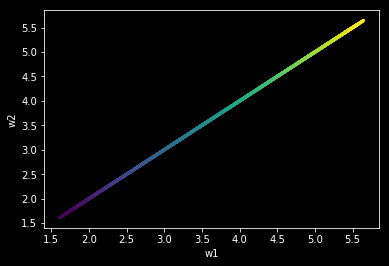

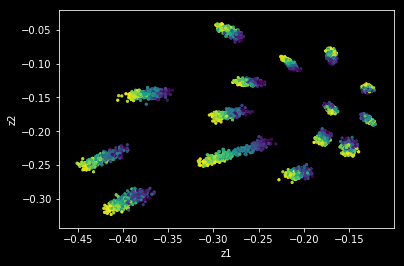

epoch: 5000, M_loss: 2.4, M1_loss: 2.7, M2_loss: -0.3, N_loss: 0.014
epoch: 5000, rec_loss: 0.126, kl_w: 0.01, kl_z: 13.76


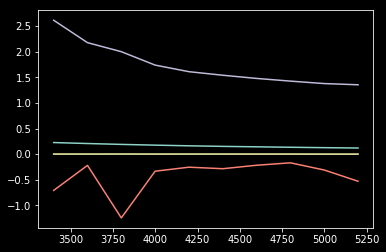

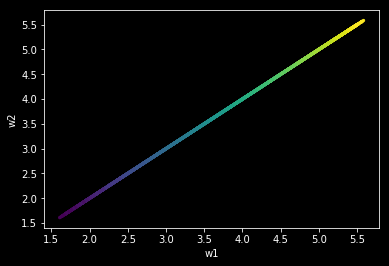

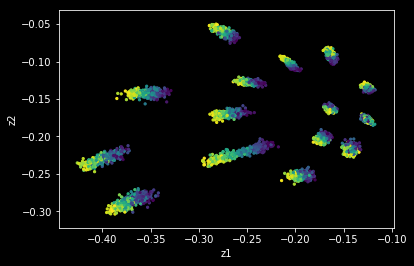

epoch: 5200, M_loss: 2.0, M1_loss: 2.6, M2_loss: -0.5, N_loss: 0.021
epoch: 5200, rec_loss: 0.120, kl_w: 0.01, kl_z: 13.53


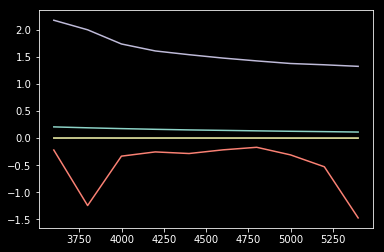

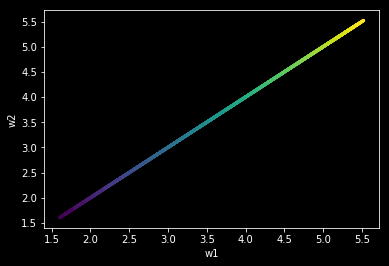

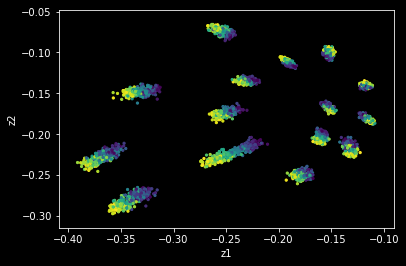

epoch: 5400, M_loss: 0.9, M1_loss: 2.4, M2_loss: -1.5, N_loss: 0.065
epoch: 5400, rec_loss: 0.112, kl_w: 0.01, kl_z: 13.24


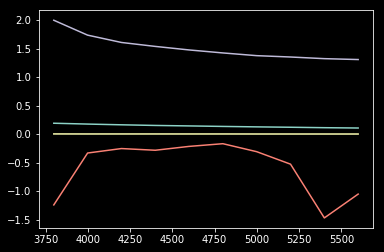

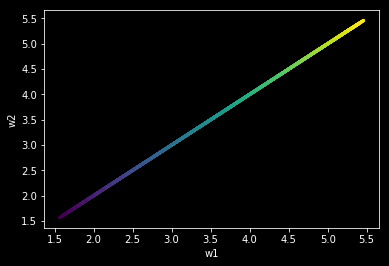

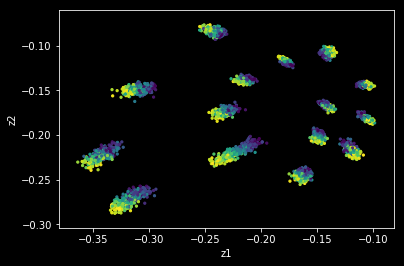

epoch: 5600, M_loss: 1.2, M1_loss: 2.3, M2_loss: -1.1, N_loss: 0.071
epoch: 5600, rec_loss: 0.106, kl_w: 0.01, kl_z: 13.08


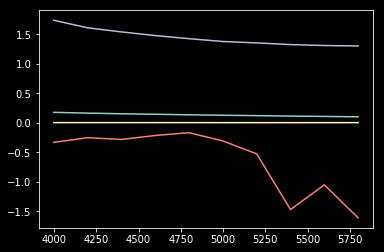

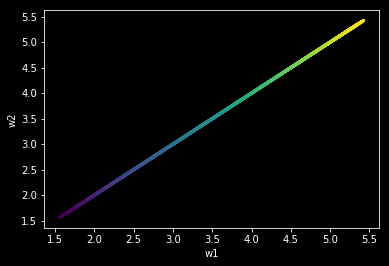

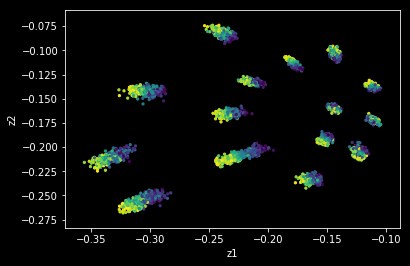

epoch: 5800, M_loss: 0.6, M1_loss: 2.2, M2_loss: -1.6, N_loss: 0.070
epoch: 5800, rec_loss: 0.100, kl_w: 0.01, kl_z: 13.00


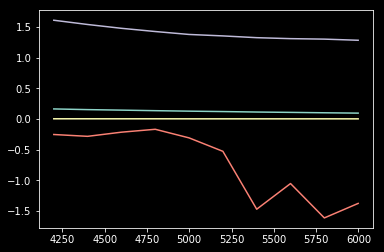

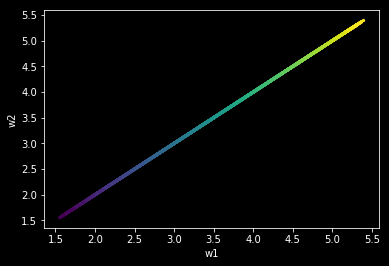

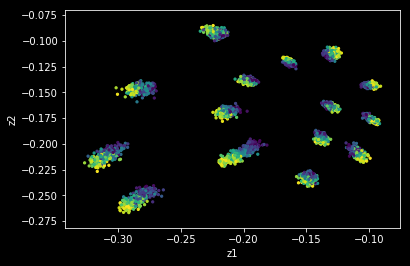

epoch: 6000, M_loss: 0.7, M1_loss: 2.0, M2_loss: -1.4, N_loss: 0.090
epoch: 6000, rec_loss: 0.094, kl_w: 0.01, kl_z: 12.82


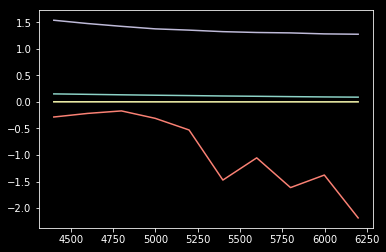

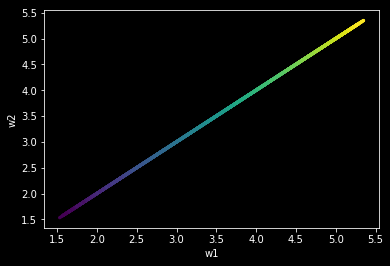

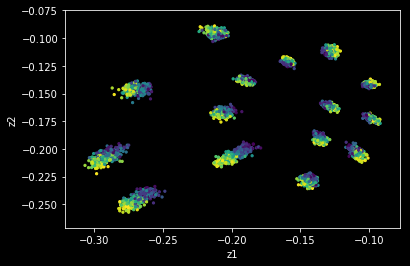

epoch: 6200, M_loss: -0.2, M1_loss: 2.0, M2_loss: -2.2, N_loss: 0.101
epoch: 6200, rec_loss: 0.090, kl_w: 0.01, kl_z: 12.75


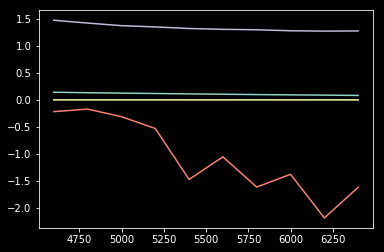

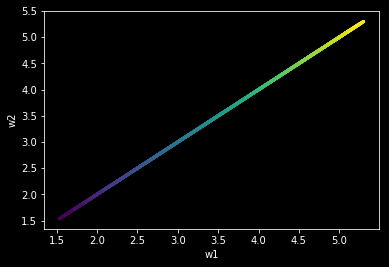

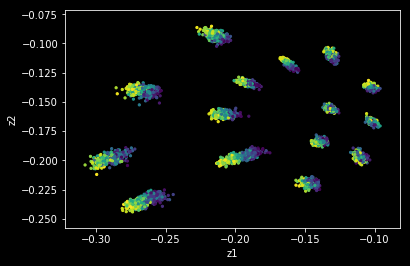

epoch: 6400, M_loss: 0.2, M1_loss: 1.8, M2_loss: -1.6, N_loss: 0.072
epoch: 6400, rec_loss: 0.084, kl_w: 0.01, kl_z: 12.78


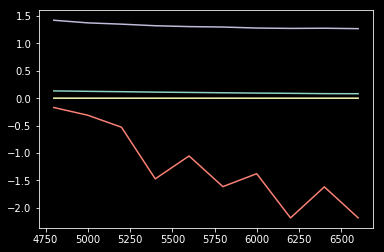

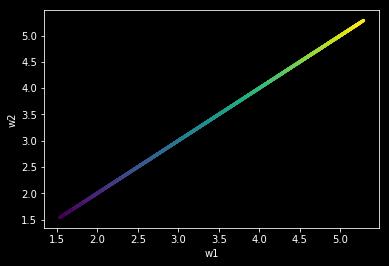

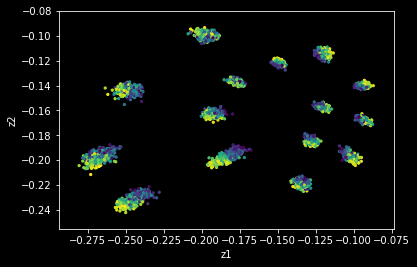

epoch: 6600, M_loss: -0.4, M1_loss: 1.8, M2_loss: -2.2, N_loss: 0.111
epoch: 6600, rec_loss: 0.082, kl_w: 0.01, kl_z: 12.70


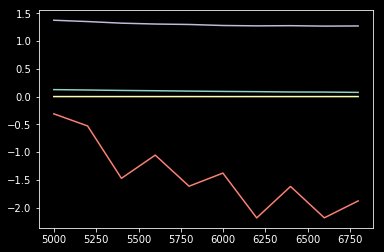

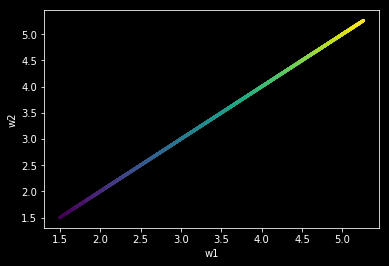

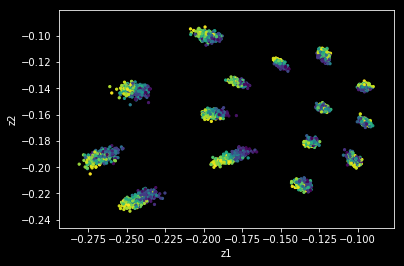

epoch: 6800, M_loss: -0.2, M1_loss: 1.7, M2_loss: -1.9, N_loss: 0.099
epoch: 6800, rec_loss: 0.077, kl_w: 0.01, kl_z: 12.73


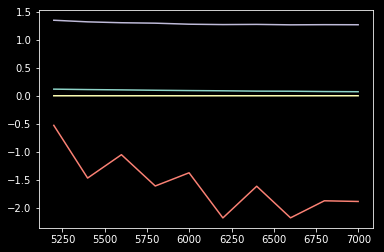

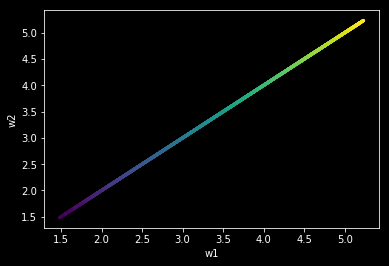

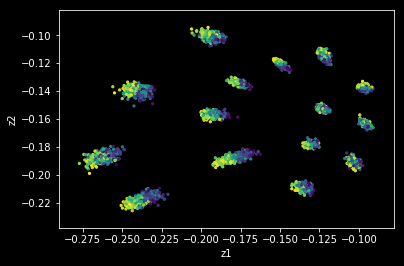

epoch: 7000, M_loss: -0.2, M1_loss: 1.6, M2_loss: -1.9, N_loss: 0.098
epoch: 7000, rec_loss: 0.073, kl_w: 0.01, kl_z: 12.72


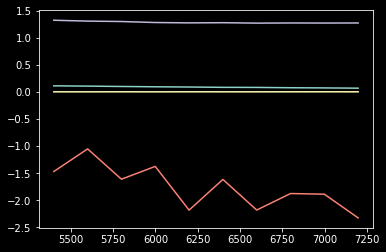

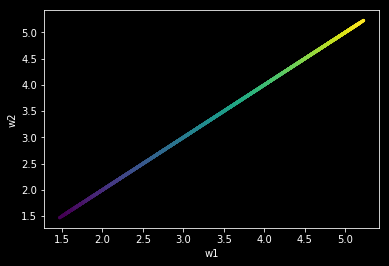

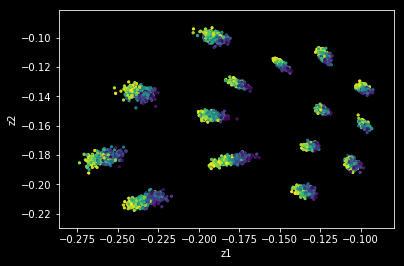

epoch: 7200, M_loss: -0.8, M1_loss: 1.5, M2_loss: -2.3, N_loss: 0.100
epoch: 7200, rec_loss: 0.069, kl_w: 0.01, kl_z: 12.73


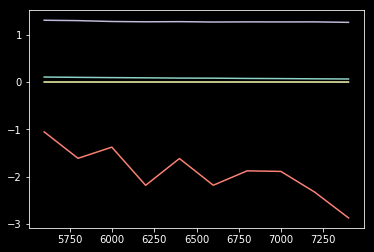

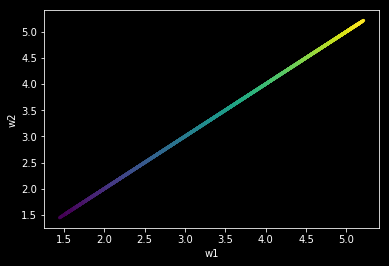

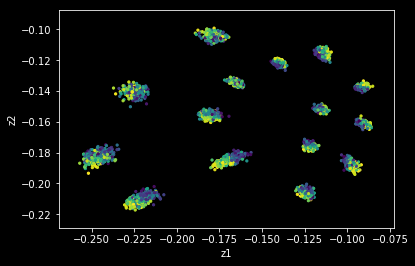

epoch: 7400, M_loss: -1.4, M1_loss: 1.5, M2_loss: -2.9, N_loss: 0.132
epoch: 7400, rec_loss: 0.065, kl_w: 0.01, kl_z: 12.63


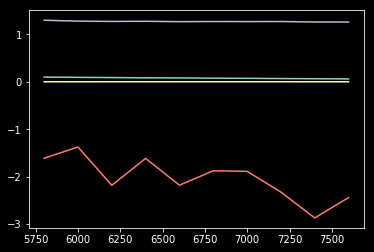

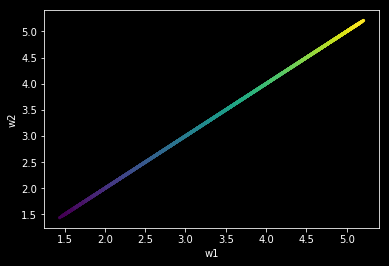

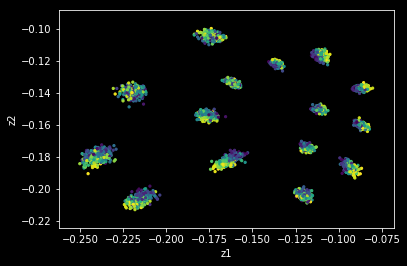

epoch: 7600, M_loss: -1.1, M1_loss: 1.4, M2_loss: -2.4, N_loss: 0.139
epoch: 7600, rec_loss: 0.061, kl_w: 0.01, kl_z: 12.62


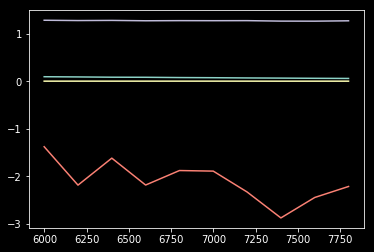

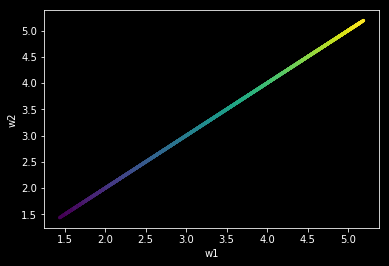

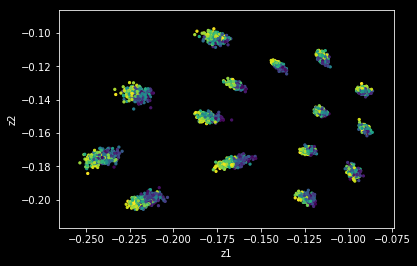

epoch: 7800, M_loss: -0.9, M1_loss: 1.3, M2_loss: -2.2, N_loss: 0.119
epoch: 7800, rec_loss: 0.058, kl_w: 0.01, kl_z: 12.70


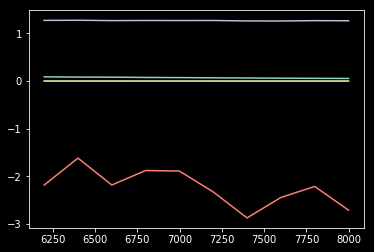

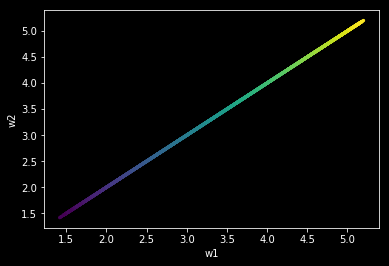

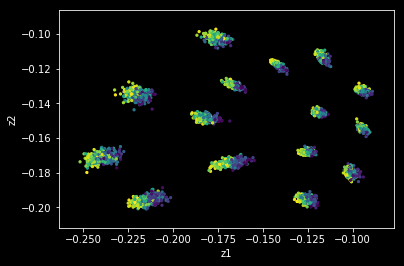

epoch: 8000, M_loss: -1.4, M1_loss: 1.3, M2_loss: -2.7, N_loss: 0.118
epoch: 8000, rec_loss: 0.056, kl_w: 0.01, kl_z: 12.68


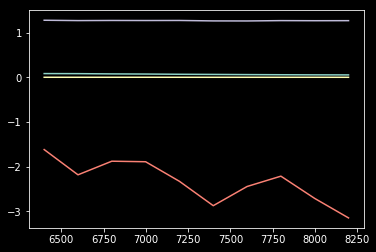

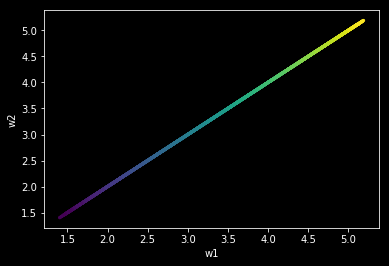

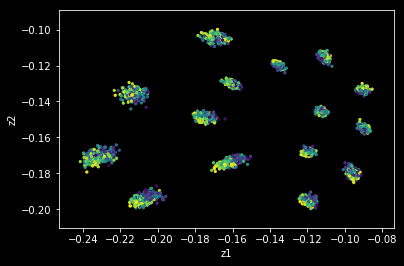

epoch: 8200, M_loss: -1.9, M1_loss: 1.2, M2_loss: -3.1, N_loss: 0.141
epoch: 8200, rec_loss: 0.054, kl_w: 0.01, kl_z: 12.69


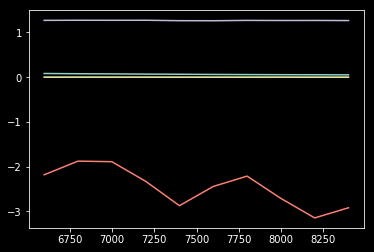

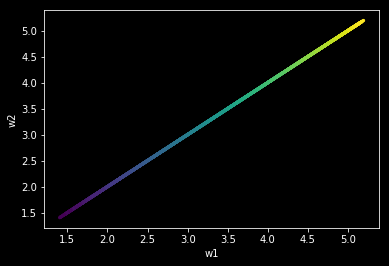

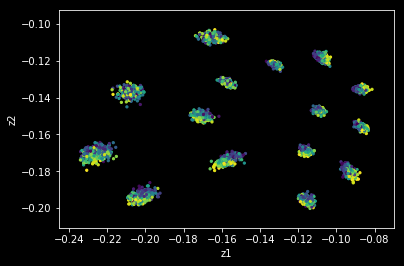

epoch: 8400, M_loss: -1.7, M1_loss: 1.2, M2_loss: -2.9, N_loss: 0.155
epoch: 8400, rec_loss: 0.052, kl_w: 0.01, kl_z: 12.66


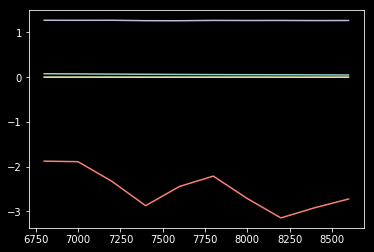

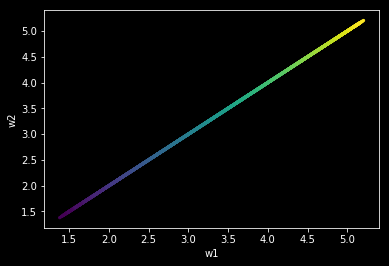

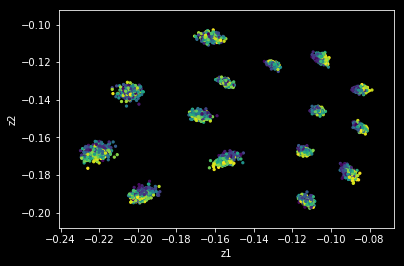

epoch: 8600, M_loss: -1.6, M1_loss: 1.1, M2_loss: -2.7, N_loss: 0.158
epoch: 8600, rec_loss: 0.049, kl_w: 0.01, kl_z: 12.68


KeyboardInterrupt: ignored

In [403]:
n_epochs = 15000
batch_size = X.shape[0]
start = time.time()

rec_out_plt = []
kl_w_plt= []
kl_z_plt = []
epoch_plt = []
M2_plt = []
N_loss_plt = []
with tf.Session() as sess:
  sess.run(tf.global_variables_initializer())
  
  
  for i in range(n_epochs):
    gen = batch_generator(X, X, U, batch_size) #create batch generator
    M_loss = 0
    N_loss = 0
    rec_loss_ = 0
    kl_w_ = 0
    kl_z_ = 0
    M1_ = 0
    M2_ = 0
    ent2_ = 0
    logN_ = 0
    
    for j in range(np.int(X.shape[0]/batch_size)):
      x_in_batch, x_out_batch, u_batch = gen.__next__()

      
      _, M_loss_, rec_loss__, kl_w__, kl_z__, M1__, ent2__, M2__= sess.run([M_train, M_cost, rec_loss, kl_w, kl_z, M1, ent2, M2], feed_dict={x_in: x_in_batch, x_out: x_out_batch, u_in: u_batch})
      M_loss += M_loss_
      rec_loss_ += rec_loss__
      kl_w_ += kl_w__
      kl_z_ += kl_z__
      M1_ += M1__
      M2_ += M2__

      _, N_loss_, logN__= sess.run([N_train, N_cost, logN], feed_dict={x_in: x_in_batch, x_out: x_out_batch, u_in: u_batch})
      N_loss += N_loss_
      logN_ += logN__

      
    if (i+1)% 200 == 0:
      wIxy_mean_, zIx_mean_, rec_out_= sess.run([wIxy_mean, zIx_mean, rec_out], feed_dict ={x_in:X, x_out:X, u_in:U})
      rec_out_plt.append(rec_loss_)
      kl_w_plt.append(kl_w_/10.0)
      kl_z_plt.append(kl_z_/10.0)
      M2_plt.append(M2_/1.0)
      N_loss_plt.append(N_loss)
      epoch_plt.append(i)
      plt.figure(1) 
      plt.plot(epoch_plt[-10:], rec_out_plt[-10:])
      plt.plot(epoch_plt[-10:], kl_w_plt[-10:])
      plt.plot(epoch_plt[-10:], kl_z_plt[-10:])
      plt.plot(epoch_plt[-10:], M2_plt[-10:])
      
      plt.figure(2)
      plt.scatter(wIxy_mean_[:,0],wIxy_mean_[:,0], c=U[:,0], cmap='viridis', s=5.0);
      plt.xlabel('w1');
      plt.ylabel('w2');
      
      plt.figure(3)
      plt.scatter(zIx_mean_[:,0],zIx_mean_[:,1], c=U[:,0], cmap='viridis', s=5.0);
      plt.xlabel('z1');
      plt.ylabel('z2');
      plt.show()
      print('epoch: {0}, M_loss: {1:.1f}, M1_loss: {2:.1f}, M2_loss: {3:.1f}, N_loss: {4:.3f}'.format((i+1), M_loss/(np.int(X.shape[0]/batch_size)), M1_/(np.int(X.shape[0]/batch_size)), M2_/(np.int(X.shape[0]/batch_size)), N_loss_/(np.int(X.shape[0]/batch_size))))
      print('epoch: {0}, rec_loss: {1:.3f}, kl_w: {2:.2f}, kl_z: {3:.2f}'.format((i+1), rec_loss_/(np.int(X.shape[0]/batch_size)), kl_w_/(np.int(X.shape[0]/batch_size)), kl_z_/(np.int(X.shape[0]/batch_size))))

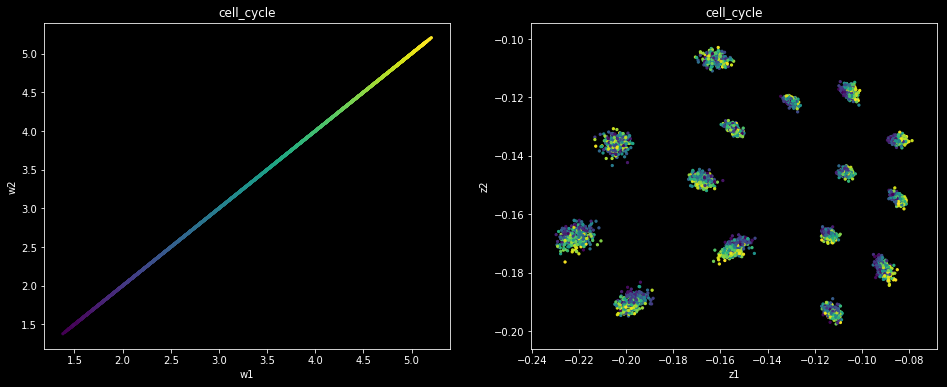

In [404]:
fig, axs = plt.subplots(1, 2, figsize=(16,6))
axs[0].scatter(wIxy_mean_[:,0],wIxy_mean_[:,0], c=U[:,0], cmap='viridis', s=5.0);
axs[0].set_xlabel('w1')
axs[0].set_ylabel('w2')
axs[0].set_title('cell_cycle')

axs[1].scatter(zIx_mean_[:,0],zIx_mean_[:,1], c=U[:,0], cmap='viridis', s=5.0);
axs[1].set_xlabel('z1')
axs[1].set_ylabel('z2')
axs[1].set_title('cell_cycle')

plt.show()

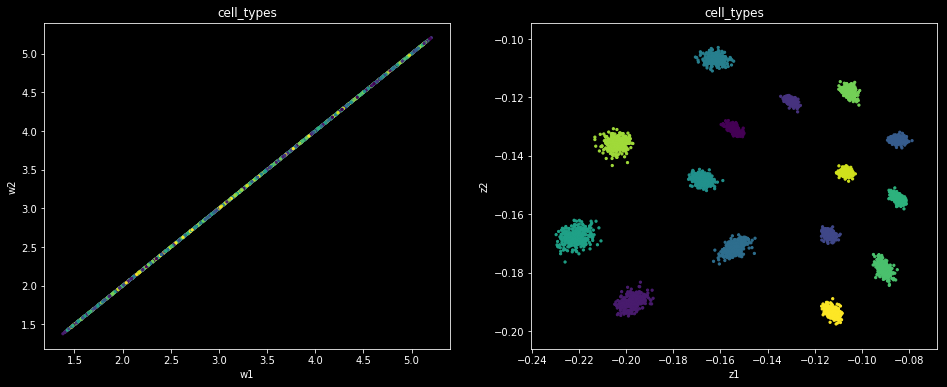

In [406]:
fig, axs = plt.subplots(1, 2, figsize=(16,6))
axs[0].scatter(wIxy_mean_[:,0],wIxy_mean_[:,0], c=Y, cmap='viridis', s=5.0);
axs[0].set_xlabel('w1')
axs[0].set_ylabel('w2')
axs[0].set_title('cell_types')

axs[1].scatter(zIx_mean_[:,0],zIx_mean_[:,1], c=Y, cmap='viridis', s=5.0);
axs[1].set_xlabel('z1')
axs[1].set_ylabel('z2')
axs[1].set_title('cell_types')

plt.show()

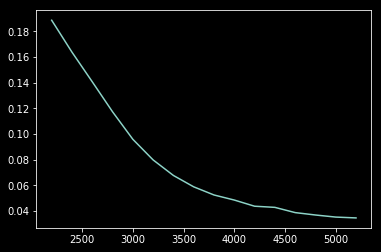

In [379]:
plt.plot(epoch_plt[10:], rec_out_plt[10:])

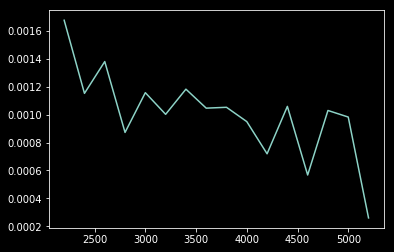

In [380]:
plt.plot(epoch_plt[10:], kl_w_plt[10:])

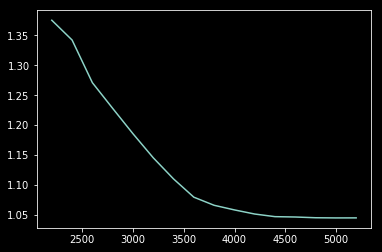

In [381]:
plt.plot(epoch_plt[10:], kl_z_plt[10:])

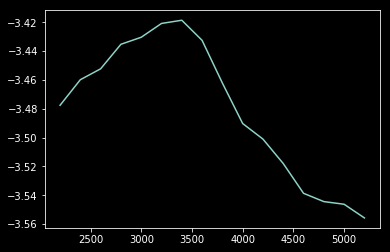

In [382]:
plt.plot(epoch_plt[10:], M2_plt[10:])

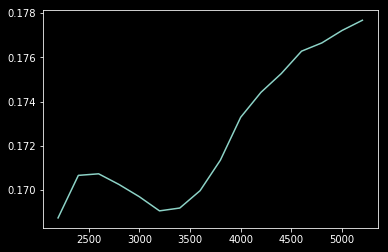

In [383]:
plt.plot(epoch_plt[10:], N_loss_plt[10:])

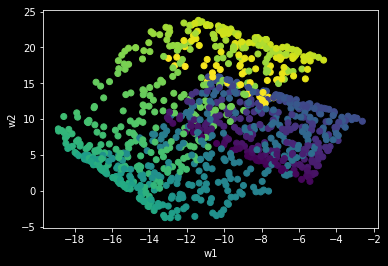

In [72]:
plt.scatter(wIxy_mean_[:,0],wIxy_mean_[:,1], c=U[:,0], cmap='viridis');
plt.xlabel('w1');
plt.ylabel('w2');

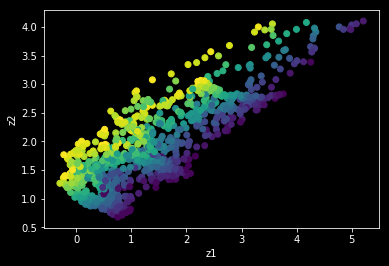

In [73]:
plt.scatter(zIx_mean_[:,0],zIx_mean_[:,1], c=X[:,1], cmap='viridis');
plt.xlabel('z1');
plt.ylabel('z2');

In [0]:
uerror = np.abs(rec_out_-X)

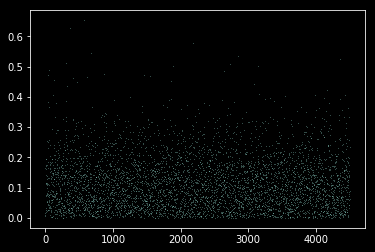

In [0]:
plt.plot(np.reshape(error, -1), '*', markersize=0.1);

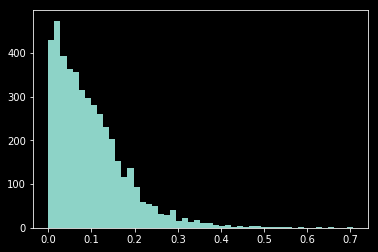

In [0]:
plt.hist(np.reshape(error, -1), bins=50);

In [0]:
np.mean(np.reshape(error, -1))

0.09923176622639865

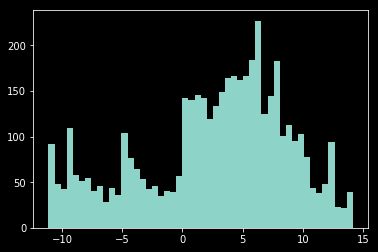

In [0]:
plt.hist(np.reshape(X, -1), bins=50);

In [0]:
#Reconstruction loss
def x_given_z(z, output_size, training_phase, reg):
  with tf.variable_scope('M/x_given_w_z'):
    act = tf.nn.leaky_relu
    
    h = z
    h = tf.layers.dense(h, 8, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 16, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 32, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 64, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 128, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 256, act, kernel_regularizer=reg)
    loc = tf.layers.dense(h, output_size)
    #log_variance = tf.layers.dense(x, latent_size)
    #scale = tf.nn.softplus(log_variance)
    scale = 0.01*tf.ones(tf.shape(loc))
    return tfd.MultivariateNormalDiag(loc, scale)


#KL term for w
def z_given_x(x, latent_size, training_phase, reg): #+
  with tf.variable_scope('M/w_given_x_y'):
    act = tf.nn.leaky_relu
    h = x
    
    h = tf.layers.dense(h, 256, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 128, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 64, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 32, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 16, act, kernel_regularizer=reg)
    h = tf.layers.dense(h, 8, act, kernel_regularizer=reg)
    
    loc = tf.layers.dense(h,latent_size)
    log_variance = tf.layers.dense(h, latent_size)
    scale = tf.nn.softplus(log_variance)
    #scale = 0.01*tf.ones(tf.shape(loc))
    return tfd.MultivariateNormalDiag(loc, scale)

def z_given(latent_size):
  with tf.variable_scope('M/z_given'):
    loc = tf.zeros(latent_size)
    scale = 0.1*tf.ones(tf.shape(loc))
    return tfd.MultivariateNormalDiag(loc, scale)

In [0]:
#Connect encoder and decoder and define the loss function
tf.reset_default_graph()

x_in = tf.placeholder(tf.float32, shape=[None, X.shape[1]], name='x_in')
x_out = tf.placeholder(tf.float32, shape=[None, X.shape[1]], name='x_out')
u_in = tf.placeholder(tf.float32, shape=[None, 1], name='u_in')
training_phase = tf.placeholder(tf.bool, None, name='training_phase')
reg = regularizers.l1_l2(l1=0.0, l2=0.00000001)


z_latent_size = 2

M_learning_rate = 5e-4
N_learning_rate = 5e-4

zIx = z_given_x(x_in, z_latent_size, training_phase, reg)
zIx_sample = zIx.sample()
zIx_mean = zIx.mean()
zI = z_given(z_latent_size)
kl_z = tf.reduce_mean(zIx.log_prob(zIx_sample)- zI.log_prob(zIx_sample))
#Reconstruction
xIz = x_given_z(zIx_sample, X.shape[1], training_phase, reg)
rec_out = xIz.mean()
rec_loss = tf.losses.mean_squared_error(x_out, rec_out)

reg1 = tf.losses.get_regularization_loss()

M_cost = rec_loss+0.001*kl_z+reg1

M_optimizer = tf.train.AdamOptimizer(M_learning_rate)

M_train_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='M/')
M_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='M/')

with tf.control_dependencies(M_update_ops):
  M_train = M_optimizer.minimize(M_cost, var_list=M_train_vars,
                                       name='train_M')


In [0]:
#Helper function
def batch_generator(features, x, u, batch_size):
  """Function to create python generator to shuffle and split features into batches along the first dimension."""
  idx = np.arange(features.shape[0])
  np.random.shuffle(idx)
  for start_idx in range(0, features.shape[0], batch_size):
    end_idx = min(start_idx + batch_size, features.shape[0])
    part = idx[start_idx:end_idx]
    yield features[part,:], x[part,:] , u[part, :]

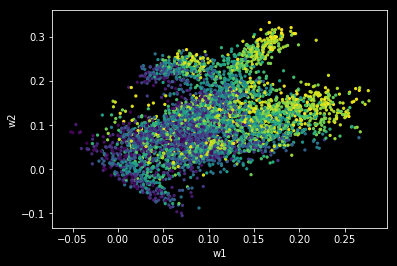

epoch: 1, M_loss: 0.5, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1, rec_loss: 0.45385, kl_w: 0.00, kl_z: 23.07


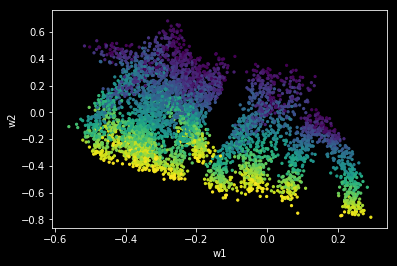

epoch: 50, M_loss: 0.4, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 50, rec_loss: 0.38422, kl_w: 0.00, kl_z: 4.13


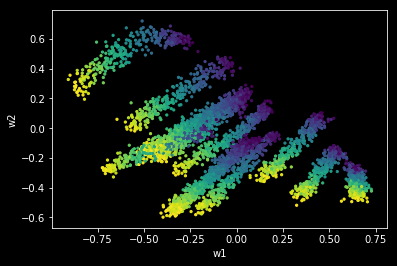

epoch: 100, M_loss: 0.3, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 100, rec_loss: 0.31654, kl_w: 0.00, kl_z: 6.08


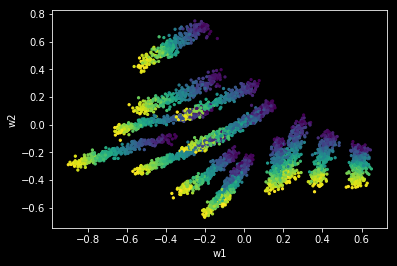

epoch: 150, M_loss: 0.3, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 150, rec_loss: 0.27324, kl_w: 0.00, kl_z: 6.52


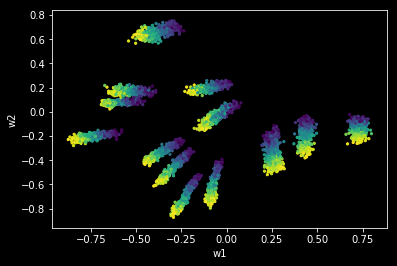

epoch: 200, M_loss: 0.2, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 200, rec_loss: 0.21974, kl_w: 0.00, kl_z: 8.70


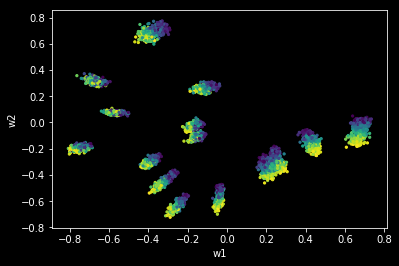

epoch: 250, M_loss: 0.2, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 250, rec_loss: 0.17320, kl_w: 0.00, kl_z: 9.45


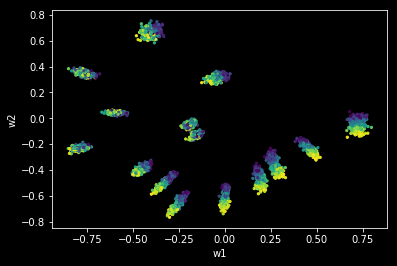

epoch: 300, M_loss: 0.1, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 300, rec_loss: 0.12453, kl_w: 0.00, kl_z: 10.81


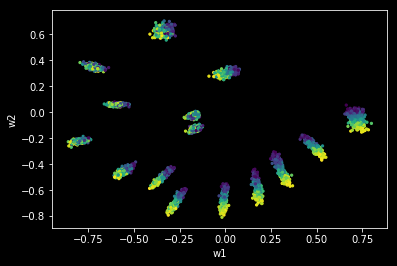

epoch: 350, M_loss: 0.1, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 350, rec_loss: 0.08712, kl_w: 0.00, kl_z: 11.51


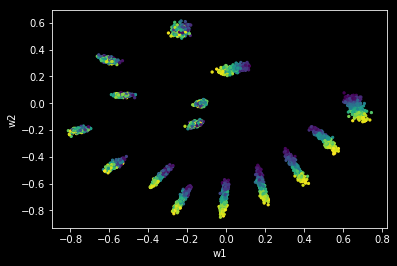

epoch: 400, M_loss: 0.1, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 400, rec_loss: 0.05758, kl_w: 0.00, kl_z: 10.90


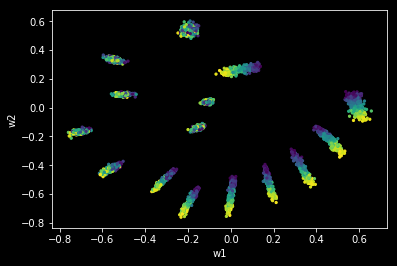

epoch: 450, M_loss: 0.1, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 450, rec_loss: 0.04361, kl_w: 0.00, kl_z: 9.79


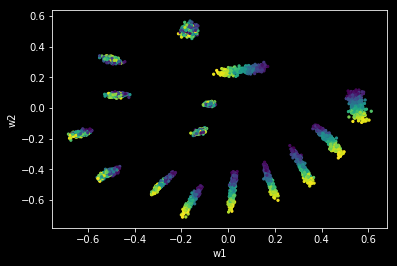

epoch: 500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 500, rec_loss: 0.03418, kl_w: 0.00, kl_z: 8.50


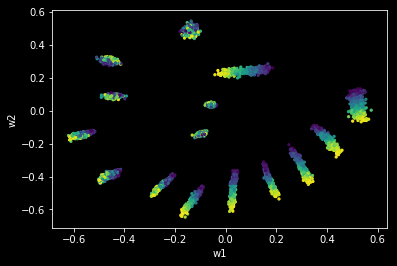

epoch: 550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 550, rec_loss: 0.02704, kl_w: 0.00, kl_z: 7.61


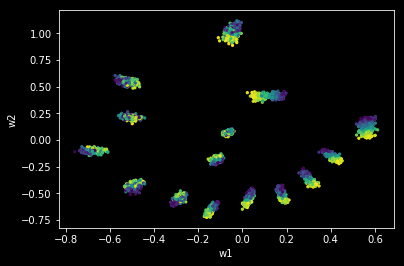

epoch: 600, M_loss: 0.1, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 600, rec_loss: 0.04088, kl_w: 0.00, kl_z: 10.33


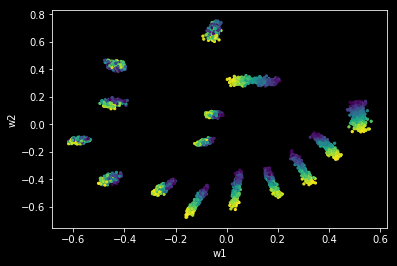

epoch: 650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 650, rec_loss: 0.02459, kl_w: 0.00, kl_z: 8.13


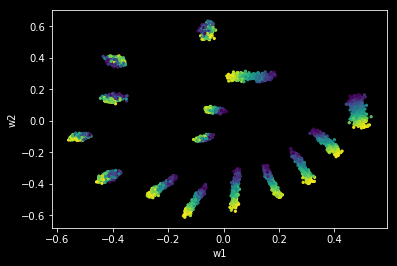

epoch: 700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 700, rec_loss: 0.02372, kl_w: 0.00, kl_z: 7.14


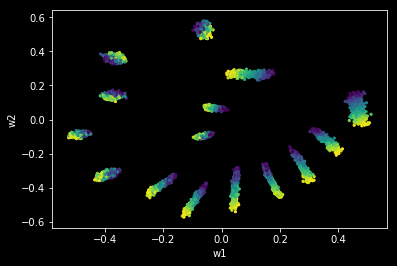

epoch: 750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 750, rec_loss: 0.02306, kl_w: 0.00, kl_z: 6.65


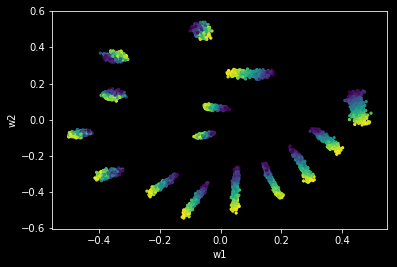

epoch: 800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 800, rec_loss: 0.02250, kl_w: 0.00, kl_z: 6.28


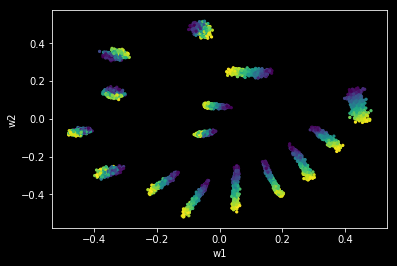

epoch: 850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 850, rec_loss: 0.02195, kl_w: 0.00, kl_z: 6.02


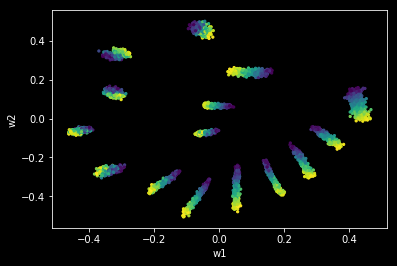

epoch: 900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 900, rec_loss: 0.02136, kl_w: 0.00, kl_z: 5.81


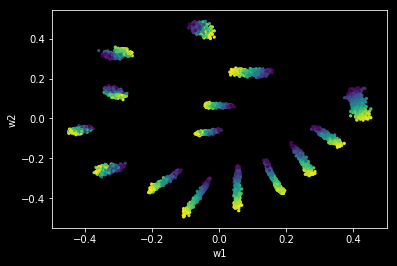

epoch: 950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 950, rec_loss: 0.02077, kl_w: 0.00, kl_z: 5.65


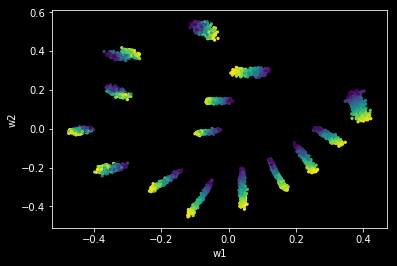

epoch: 1000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1000, rec_loss: 0.03861, kl_w: 0.00, kl_z: 5.67


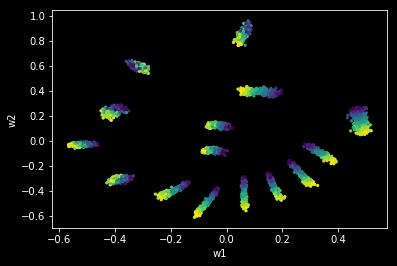

epoch: 1050, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1050, rec_loss: 0.02246, kl_w: 0.00, kl_z: 7.94


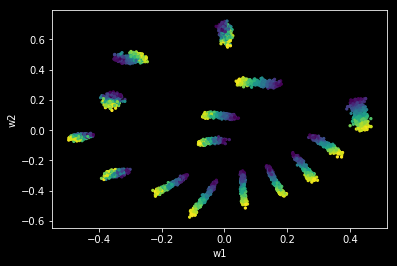

epoch: 1100, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1100, rec_loss: 0.02044, kl_w: 0.00, kl_z: 6.52


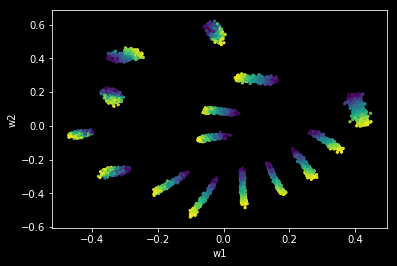

epoch: 1150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1150, rec_loss: 0.01990, kl_w: 0.00, kl_z: 6.04


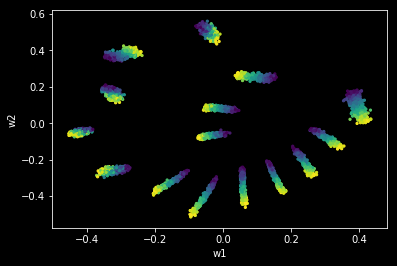

epoch: 1200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1200, rec_loss: 0.01955, kl_w: 0.00, kl_z: 5.74


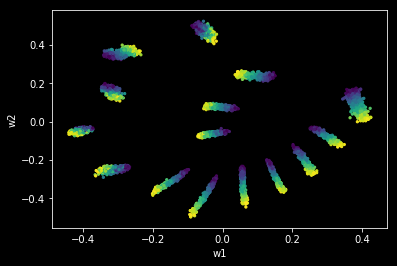

epoch: 1250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1250, rec_loss: 0.01924, kl_w: 0.00, kl_z: 5.55


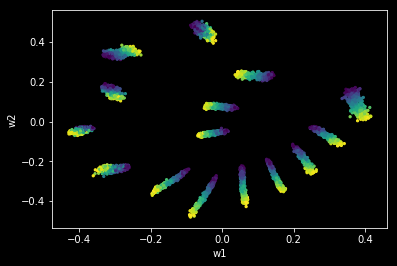

epoch: 1300, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1300, rec_loss: 0.01890, kl_w: 0.00, kl_z: 5.42


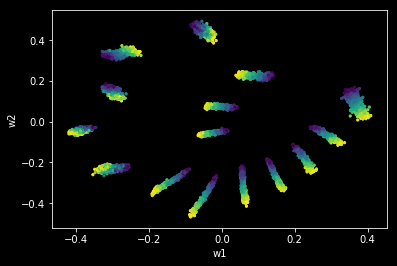

epoch: 1350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1350, rec_loss: 0.01865, kl_w: 0.00, kl_z: 5.30


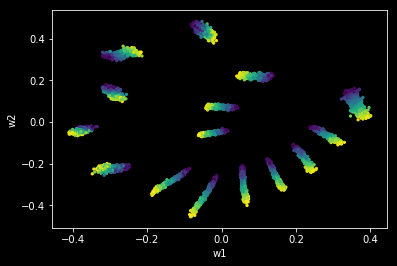

epoch: 1400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1400, rec_loss: 0.01834, kl_w: 0.00, kl_z: 5.21


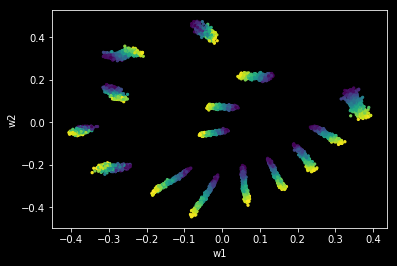

epoch: 1450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1450, rec_loss: 0.01816, kl_w: 0.00, kl_z: 5.12


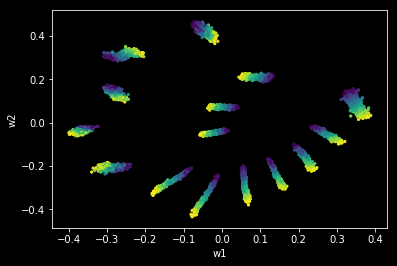

epoch: 1500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1500, rec_loss: 0.01790, kl_w: 0.00, kl_z: 5.07


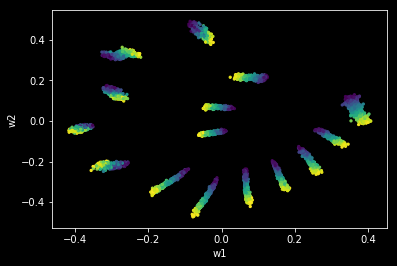

epoch: 1550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1550, rec_loss: 0.01876, kl_w: 0.00, kl_z: 5.24


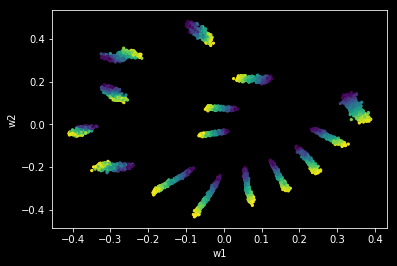

epoch: 1600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1600, rec_loss: 0.01754, kl_w: 0.00, kl_z: 5.03


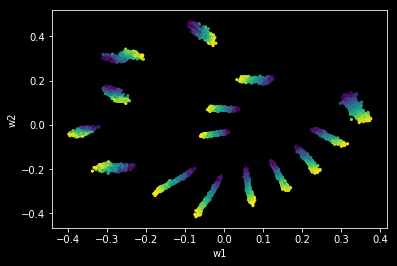

epoch: 1650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1650, rec_loss: 0.01728, kl_w: 0.00, kl_z: 4.94


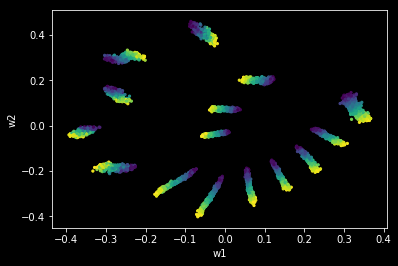

epoch: 1700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1700, rec_loss: 0.01710, kl_w: 0.00, kl_z: 4.87


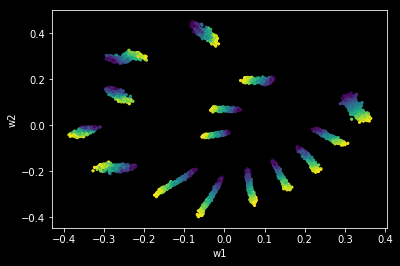

epoch: 1750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1750, rec_loss: 0.01770, kl_w: 0.00, kl_z: 4.85


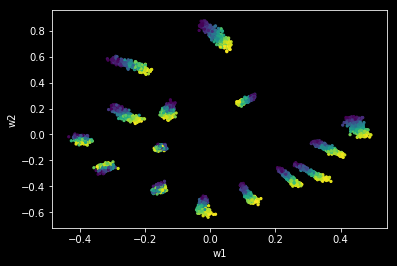

epoch: 1800, M_loss: 0.2, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1800, rec_loss: 0.19584, kl_w: 0.00, kl_z: 6.58


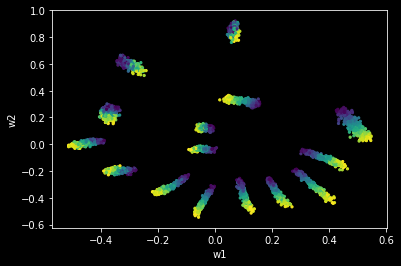

epoch: 1850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1850, rec_loss: 0.02039, kl_w: 0.00, kl_z: 7.59


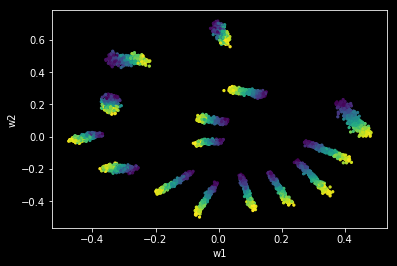

epoch: 1900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1900, rec_loss: 0.01838, kl_w: 0.00, kl_z: 6.20


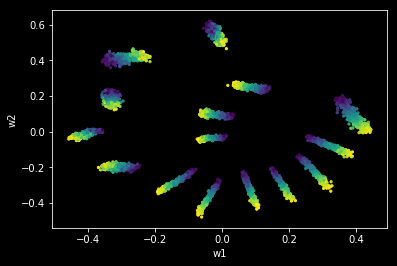

epoch: 1950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 1950, rec_loss: 0.01784, kl_w: 0.00, kl_z: 5.67


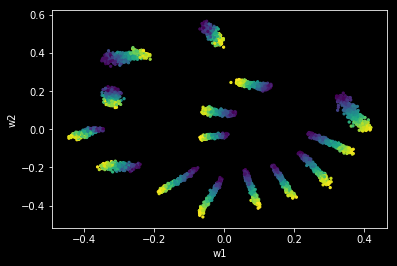

epoch: 2000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2000, rec_loss: 0.01754, kl_w: 0.00, kl_z: 5.39


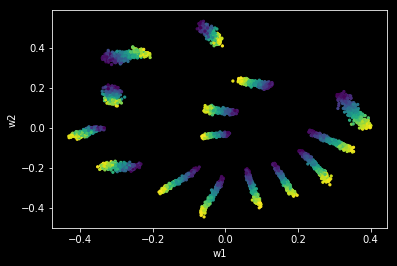

epoch: 2050, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2050, rec_loss: 0.01730, kl_w: 0.00, kl_z: 5.22


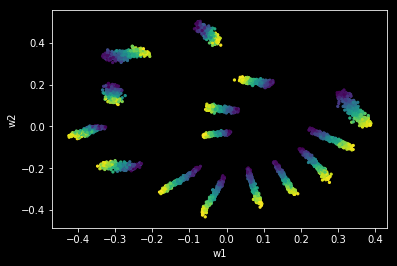

epoch: 2100, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2100, rec_loss: 0.01710, kl_w: 0.00, kl_z: 5.10


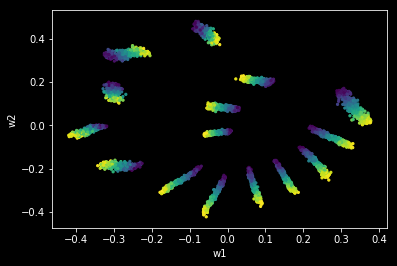

epoch: 2150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2150, rec_loss: 0.01693, kl_w: 0.00, kl_z: 4.99


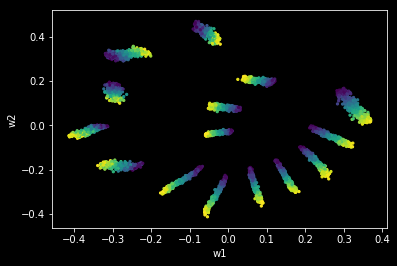

epoch: 2200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2200, rec_loss: 0.01677, kl_w: 0.00, kl_z: 4.92


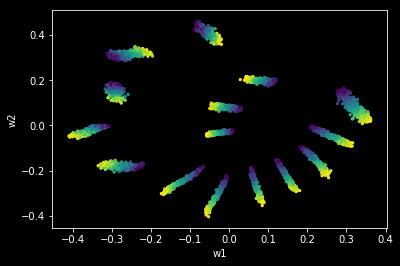

epoch: 2250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2250, rec_loss: 0.01662, kl_w: 0.00, kl_z: 4.85


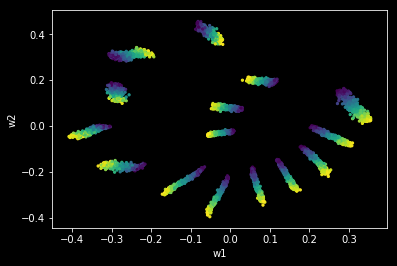

epoch: 2300, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2300, rec_loss: 0.01645, kl_w: 0.00, kl_z: 4.80


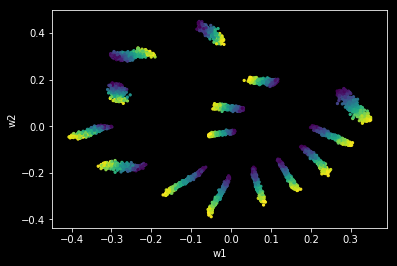

epoch: 2350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2350, rec_loss: 0.01629, kl_w: 0.00, kl_z: 4.76


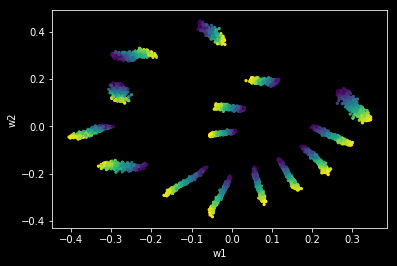

epoch: 2400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2400, rec_loss: 0.01613, kl_w: 0.00, kl_z: 4.73


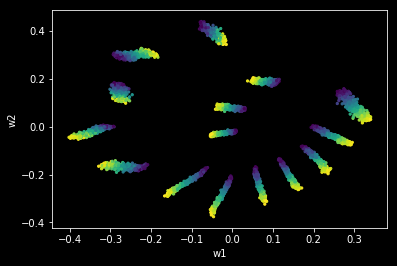

epoch: 2450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2450, rec_loss: 0.01598, kl_w: 0.00, kl_z: 4.70


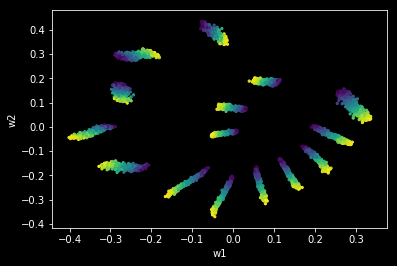

epoch: 2500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2500, rec_loss: 0.01585, kl_w: 0.00, kl_z: 4.66


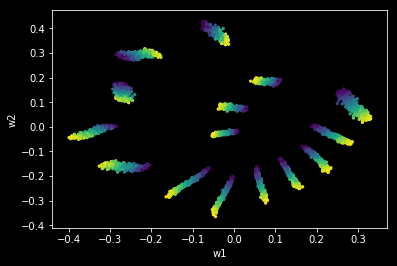

epoch: 2550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2550, rec_loss: 0.01570, kl_w: 0.00, kl_z: 4.61


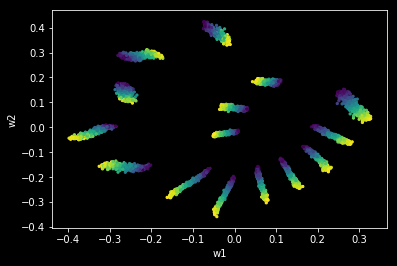

epoch: 2600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2600, rec_loss: 0.01551, kl_w: 0.00, kl_z: 4.60


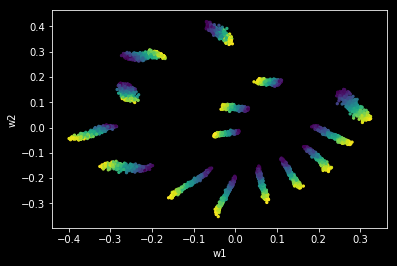

epoch: 2650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2650, rec_loss: 0.01532, kl_w: 0.00, kl_z: 4.57


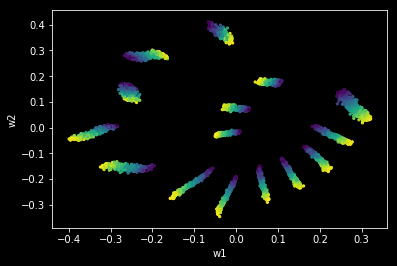

epoch: 2700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2700, rec_loss: 0.01516, kl_w: 0.00, kl_z: 4.54


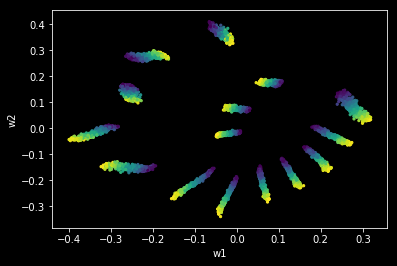

epoch: 2750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2750, rec_loss: 0.01498, kl_w: 0.00, kl_z: 4.53


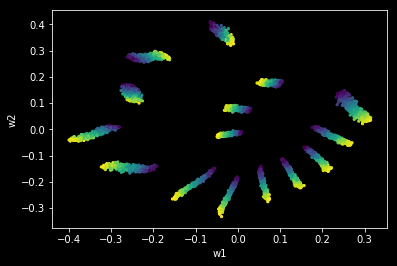

epoch: 2800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2800, rec_loss: 0.01507, kl_w: 0.00, kl_z: 4.49


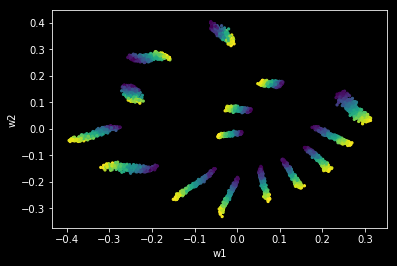

epoch: 2850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2850, rec_loss: 0.01493, kl_w: 0.00, kl_z: 4.48


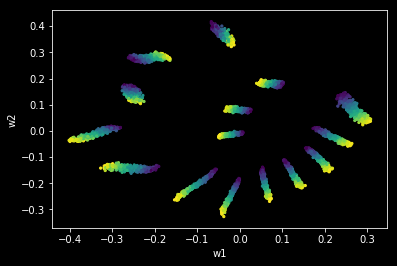

epoch: 2900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2900, rec_loss: 0.01504, kl_w: 0.00, kl_z: 4.46


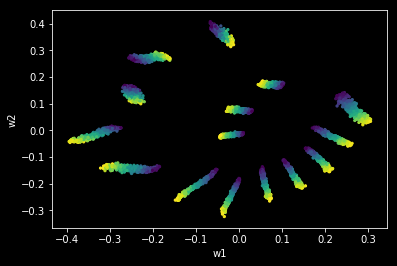

epoch: 2950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 2950, rec_loss: 0.01452, kl_w: 0.00, kl_z: 4.43


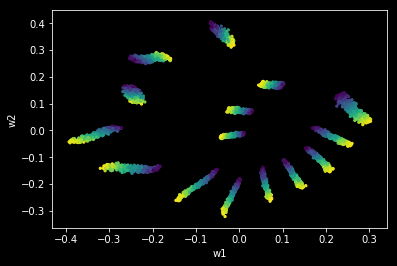

epoch: 3000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3000, rec_loss: 0.01449, kl_w: 0.00, kl_z: 4.43


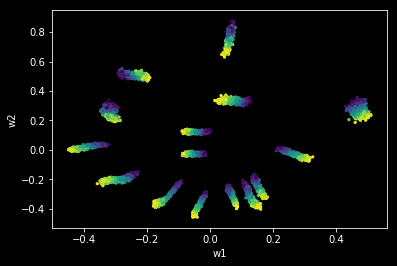

epoch: 3050, M_loss: 0.1, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3050, rec_loss: 0.04623, kl_w: 0.00, kl_z: 6.73


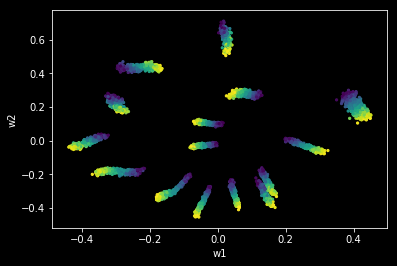

epoch: 3100, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3100, rec_loss: 0.03660, kl_w: 0.00, kl_z: 5.91


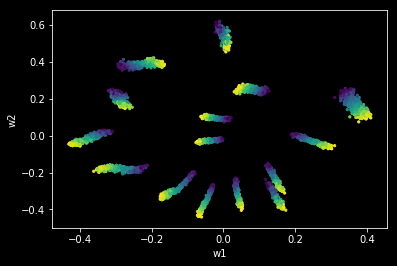

epoch: 3150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3150, rec_loss: 0.03409, kl_w: 0.00, kl_z: 5.50


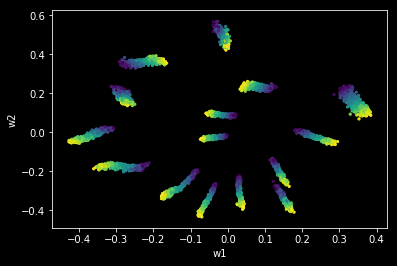

epoch: 3200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3200, rec_loss: 0.03095, kl_w: 0.00, kl_z: 5.31


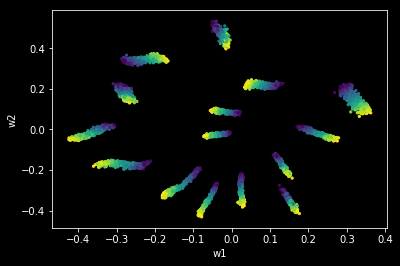

epoch: 3250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3250, rec_loss: 0.02664, kl_w: 0.00, kl_z: 5.19


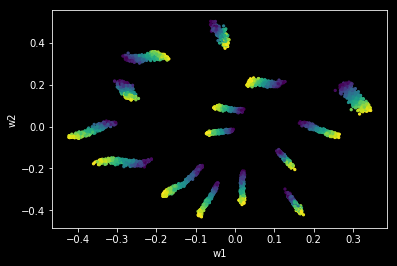

epoch: 3300, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3300, rec_loss: 0.02202, kl_w: 0.00, kl_z: 5.11


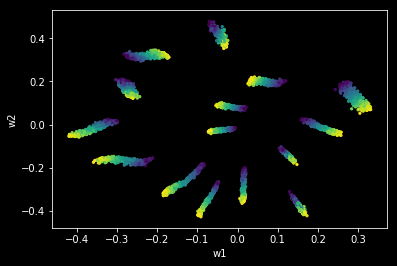

epoch: 3350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3350, rec_loss: 0.01896, kl_w: 0.00, kl_z: 5.01


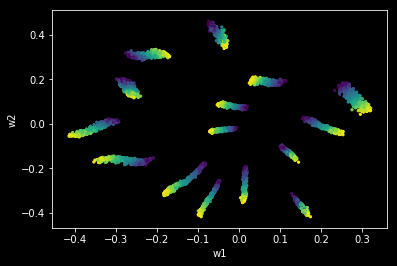

epoch: 3400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3400, rec_loss: 0.01739, kl_w: 0.00, kl_z: 4.91


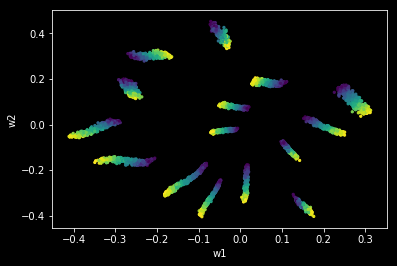

epoch: 3450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3450, rec_loss: 0.01655, kl_w: 0.00, kl_z: 4.82


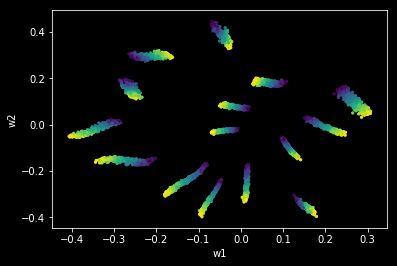

epoch: 3500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3500, rec_loss: 0.01592, kl_w: 0.00, kl_z: 4.78


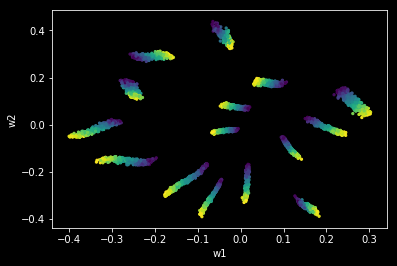

epoch: 3550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3550, rec_loss: 0.01552, kl_w: 0.00, kl_z: 4.72


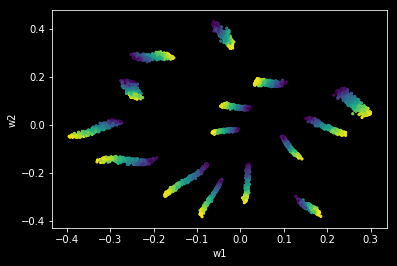

epoch: 3600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3600, rec_loss: 0.01522, kl_w: 0.00, kl_z: 4.68


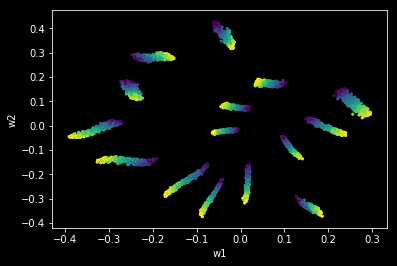

epoch: 3650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3650, rec_loss: 0.01497, kl_w: 0.00, kl_z: 4.65


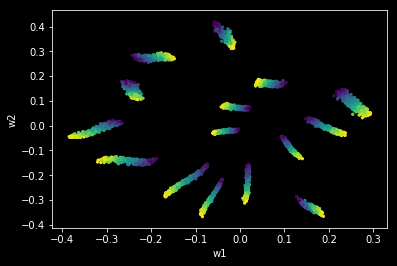

epoch: 3700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3700, rec_loss: 0.01479, kl_w: 0.00, kl_z: 4.59


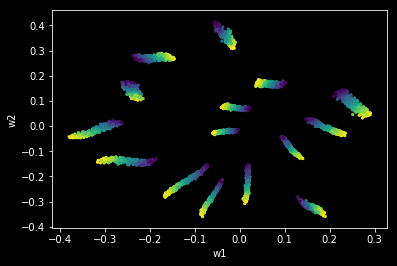

epoch: 3750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3750, rec_loss: 0.01461, kl_w: 0.00, kl_z: 4.56


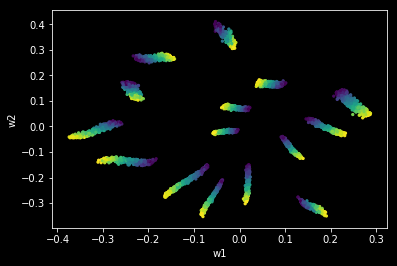

epoch: 3800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3800, rec_loss: 0.01446, kl_w: 0.00, kl_z: 4.52


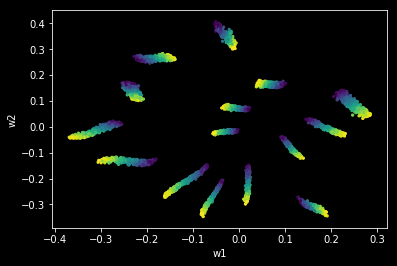

epoch: 3850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3850, rec_loss: 0.01435, kl_w: 0.00, kl_z: 4.50


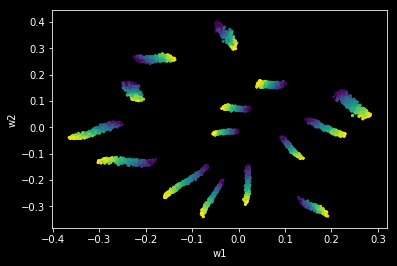

epoch: 3900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3900, rec_loss: 0.01421, kl_w: 0.00, kl_z: 4.45


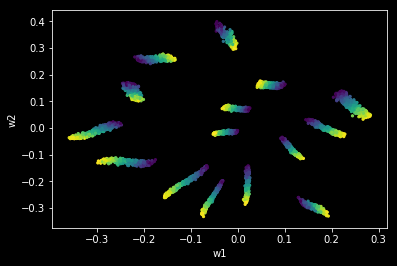

epoch: 3950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 3950, rec_loss: 0.01411, kl_w: 0.00, kl_z: 4.43


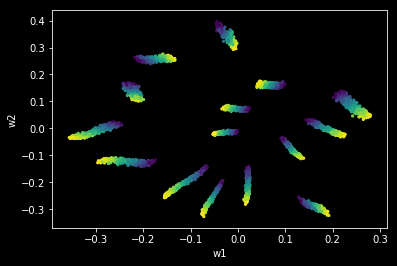

epoch: 4000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4000, rec_loss: 0.01406, kl_w: 0.00, kl_z: 4.40


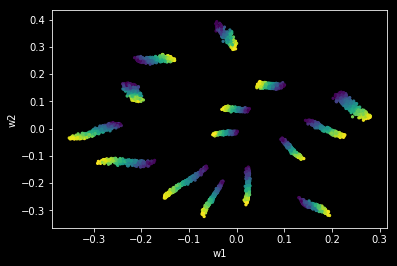

epoch: 4050, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4050, rec_loss: 0.01400, kl_w: 0.00, kl_z: 4.36


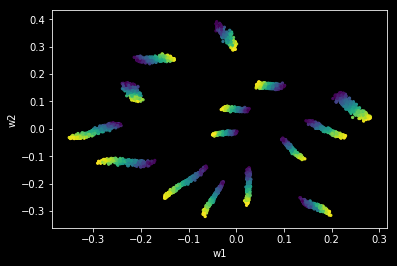

epoch: 4100, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4100, rec_loss: 0.01407, kl_w: 0.00, kl_z: 4.36


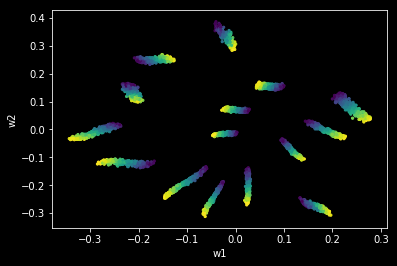

epoch: 4150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4150, rec_loss: 0.01392, kl_w: 0.00, kl_z: 4.34


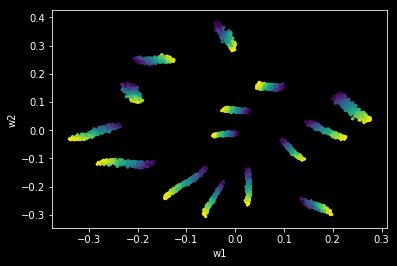

epoch: 4200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4200, rec_loss: 0.01382, kl_w: 0.00, kl_z: 4.31


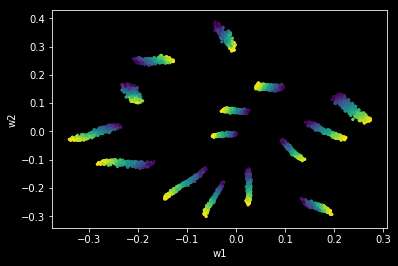

epoch: 4250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4250, rec_loss: 0.01385, kl_w: 0.00, kl_z: 4.29


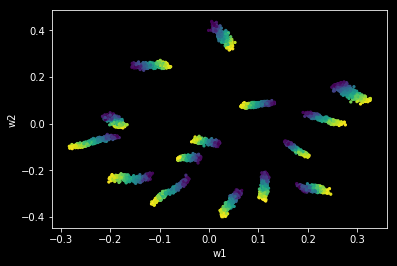

epoch: 4300, M_loss: 0.6, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4300, rec_loss: 0.64412, kl_w: 0.00, kl_z: 4.68


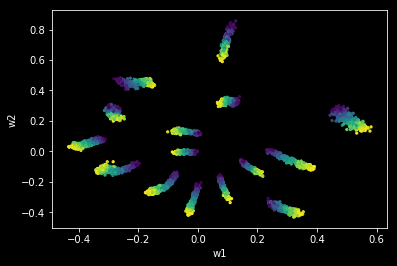

epoch: 4350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4350, rec_loss: 0.01908, kl_w: 0.00, kl_z: 6.53


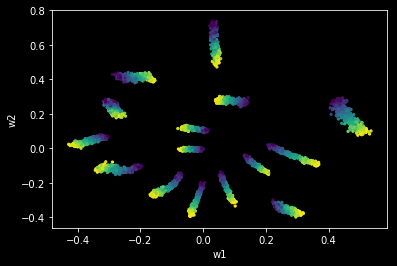

epoch: 4400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4400, rec_loss: 0.01548, kl_w: 0.00, kl_z: 5.70


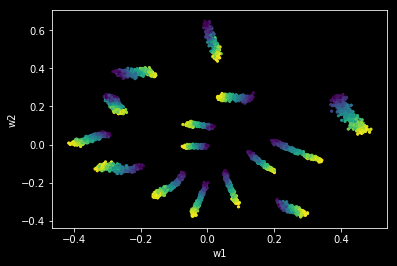

epoch: 4450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4450, rec_loss: 0.01480, kl_w: 0.00, kl_z: 5.29


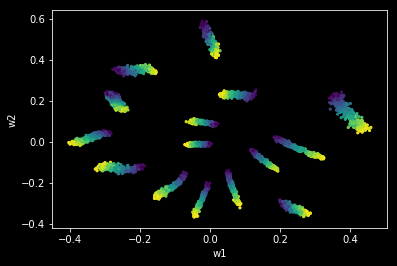

epoch: 4500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4500, rec_loss: 0.01450, kl_w: 0.00, kl_z: 5.03


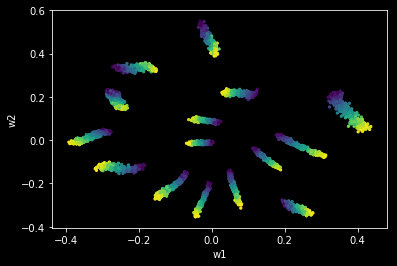

epoch: 4550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4550, rec_loss: 0.01432, kl_w: 0.00, kl_z: 4.87


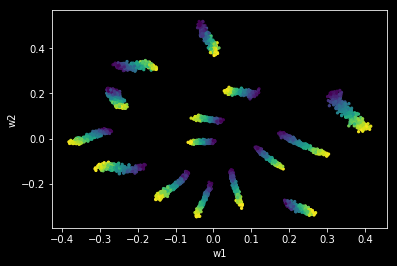

epoch: 4600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4600, rec_loss: 0.01419, kl_w: 0.00, kl_z: 4.75


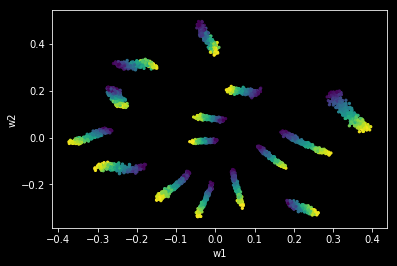

epoch: 4650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4650, rec_loss: 0.01410, kl_w: 0.00, kl_z: 4.66


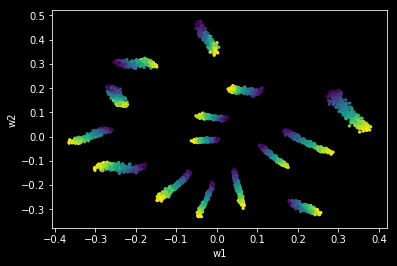

epoch: 4700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4700, rec_loss: 0.01398, kl_w: 0.00, kl_z: 4.57


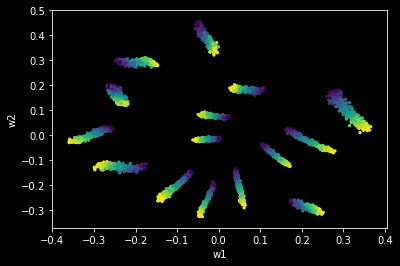

epoch: 4750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4750, rec_loss: 0.01394, kl_w: 0.00, kl_z: 4.50


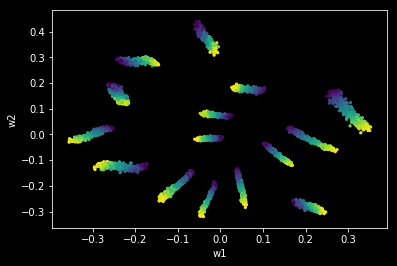

epoch: 4800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4800, rec_loss: 0.01385, kl_w: 0.00, kl_z: 4.45


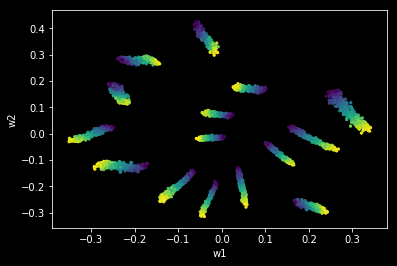

epoch: 4850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4850, rec_loss: 0.01377, kl_w: 0.00, kl_z: 4.41


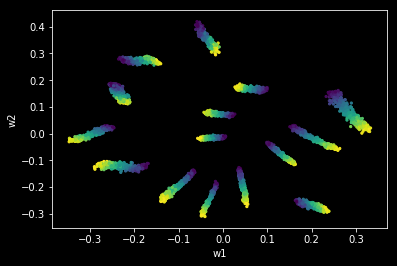

epoch: 4900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4900, rec_loss: 0.01373, kl_w: 0.00, kl_z: 4.38


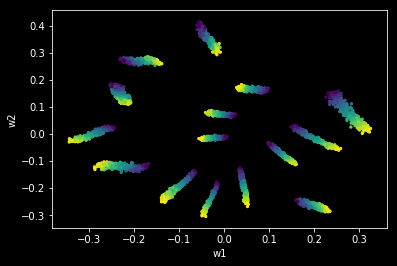

epoch: 4950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 4950, rec_loss: 0.01370, kl_w: 0.00, kl_z: 4.33


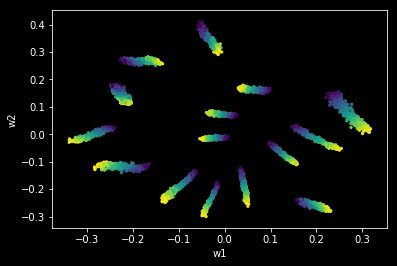

epoch: 5000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5000, rec_loss: 0.01365, kl_w: 0.00, kl_z: 4.32


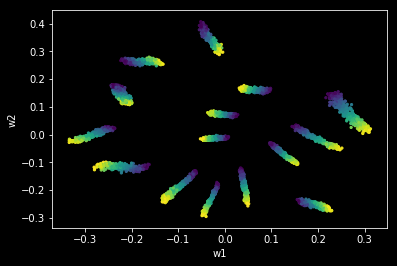

epoch: 5050, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5050, rec_loss: 0.01361, kl_w: 0.00, kl_z: 4.27


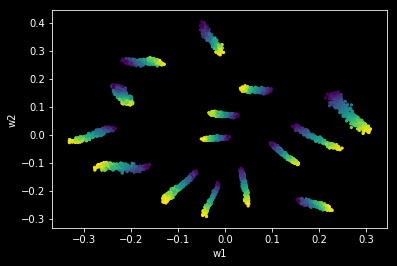

epoch: 5100, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5100, rec_loss: 0.01356, kl_w: 0.00, kl_z: 4.26


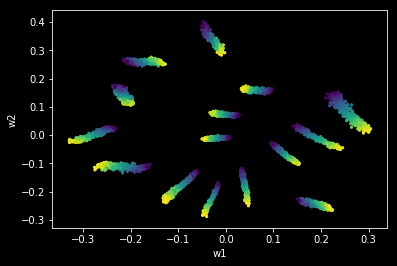

epoch: 5150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5150, rec_loss: 0.01354, kl_w: 0.00, kl_z: 4.23


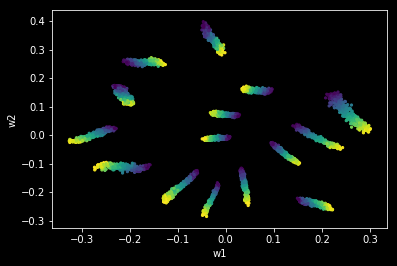

epoch: 5200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5200, rec_loss: 0.01350, kl_w: 0.00, kl_z: 4.22


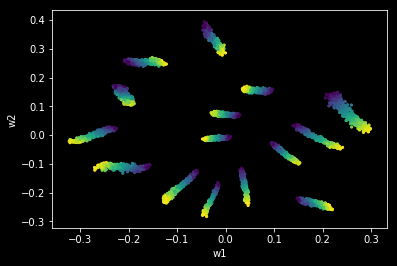

epoch: 5250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5250, rec_loss: 0.01346, kl_w: 0.00, kl_z: 4.20


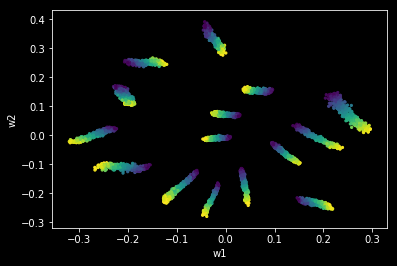

epoch: 5300, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5300, rec_loss: 0.01344, kl_w: 0.00, kl_z: 4.18


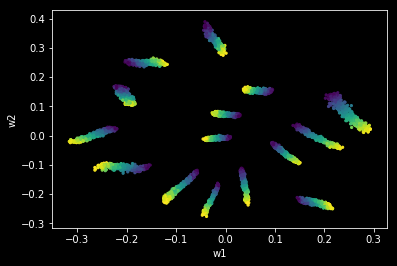

epoch: 5350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5350, rec_loss: 0.01342, kl_w: 0.00, kl_z: 4.17


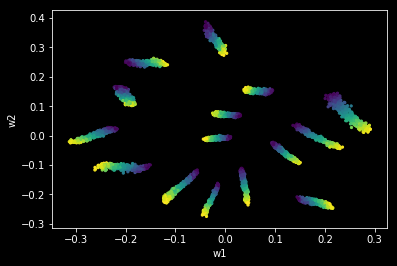

epoch: 5400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5400, rec_loss: 0.01337, kl_w: 0.00, kl_z: 4.16


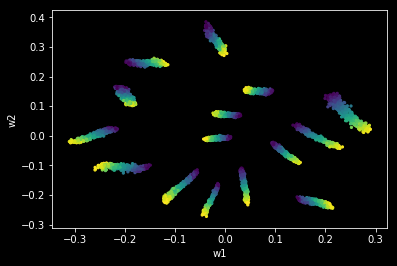

epoch: 5450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5450, rec_loss: 0.01337, kl_w: 0.00, kl_z: 4.14


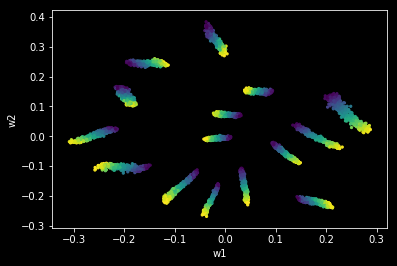

epoch: 5500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5500, rec_loss: 0.01332, kl_w: 0.00, kl_z: 4.13


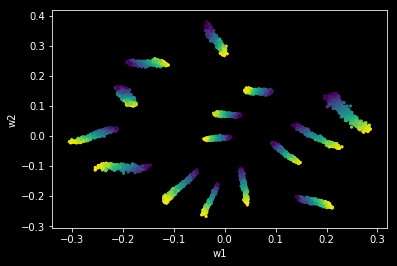

epoch: 5550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5550, rec_loss: 0.01331, kl_w: 0.00, kl_z: 4.11


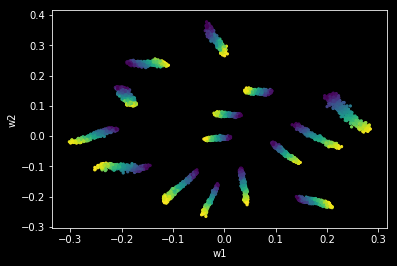

epoch: 5600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5600, rec_loss: 0.01328, kl_w: 0.00, kl_z: 4.11


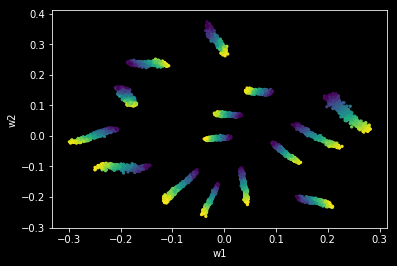

epoch: 5650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5650, rec_loss: 0.01328, kl_w: 0.00, kl_z: 4.09


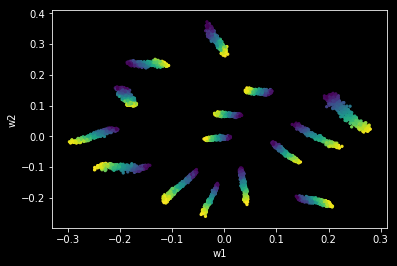

epoch: 5700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5700, rec_loss: 0.01325, kl_w: 0.00, kl_z: 4.06


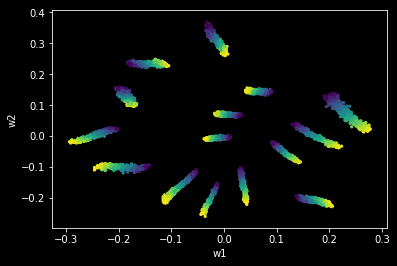

epoch: 5750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5750, rec_loss: 0.01324, kl_w: 0.00, kl_z: 4.06


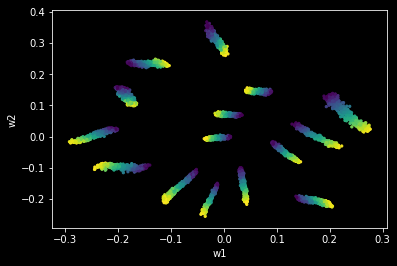

epoch: 5800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5800, rec_loss: 0.01326, kl_w: 0.00, kl_z: 4.05


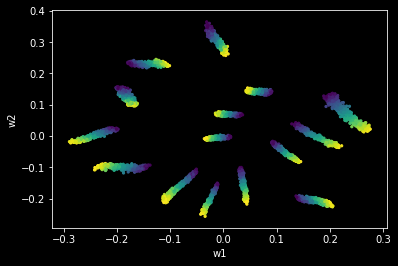

epoch: 5850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5850, rec_loss: 0.01319, kl_w: 0.00, kl_z: 4.05


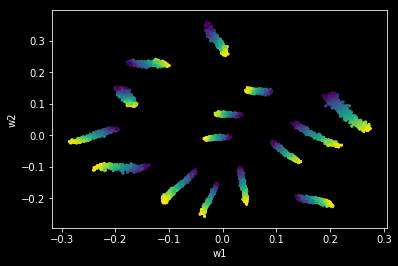

epoch: 5900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5900, rec_loss: 0.01339, kl_w: 0.00, kl_z: 4.04


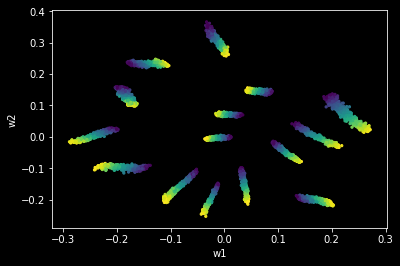

epoch: 5950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 5950, rec_loss: 0.01336, kl_w: 0.00, kl_z: 4.02


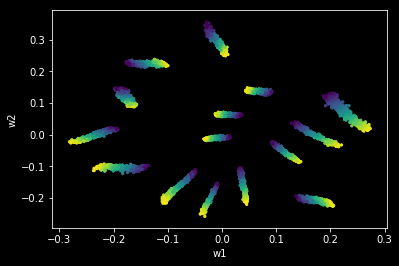

epoch: 6000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6000, rec_loss: 0.01401, kl_w: 0.00, kl_z: 4.03


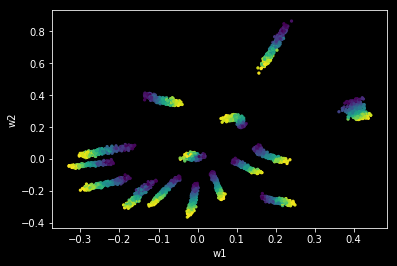

epoch: 6050, M_loss: 0.1, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6050, rec_loss: 0.05738, kl_w: 0.00, kl_z: 6.32


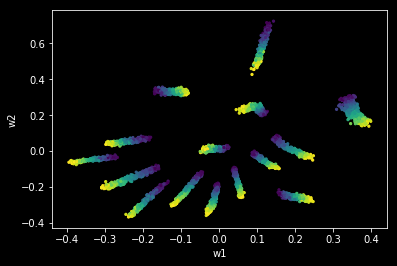

epoch: 6100, M_loss: 0.1, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6100, rec_loss: 0.04494, kl_w: 0.00, kl_z: 5.38


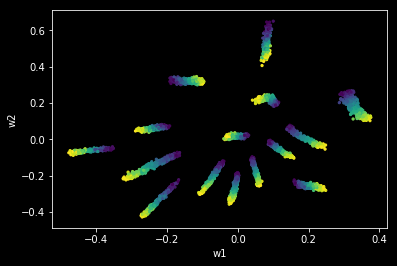

epoch: 6150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6150, rec_loss: 0.03535, kl_w: 0.00, kl_z: 5.31


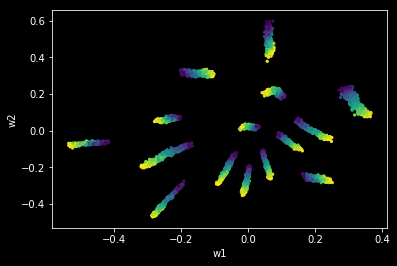

epoch: 6200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6200, rec_loss: 0.02772, kl_w: 0.00, kl_z: 5.37


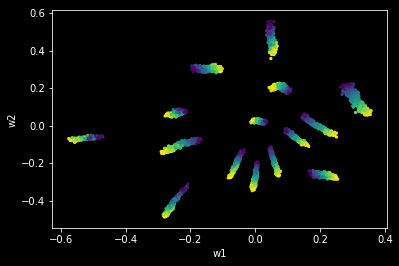

epoch: 6250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6250, rec_loss: 0.02174, kl_w: 0.00, kl_z: 5.37


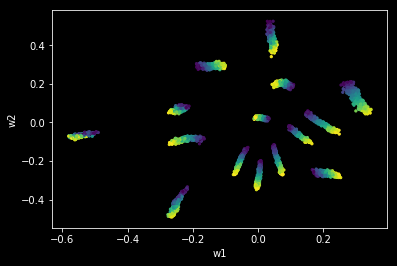

epoch: 6300, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6300, rec_loss: 0.01862, kl_w: 0.00, kl_z: 5.31


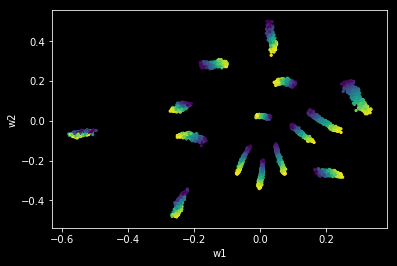

epoch: 6350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6350, rec_loss: 0.01718, kl_w: 0.00, kl_z: 5.21


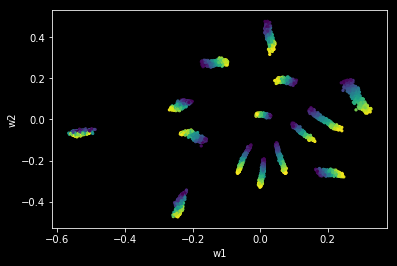

epoch: 6400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6400, rec_loss: 0.01644, kl_w: 0.00, kl_z: 5.12


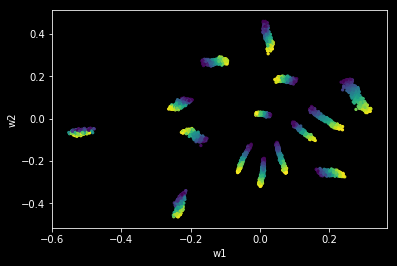

epoch: 6450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6450, rec_loss: 0.01604, kl_w: 0.00, kl_z: 5.00


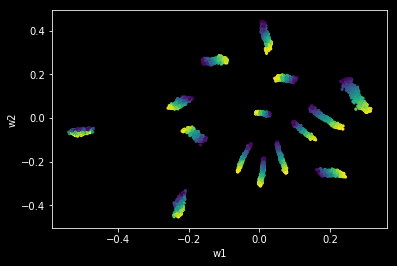

epoch: 6500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6500, rec_loss: 0.01578, kl_w: 0.00, kl_z: 4.90


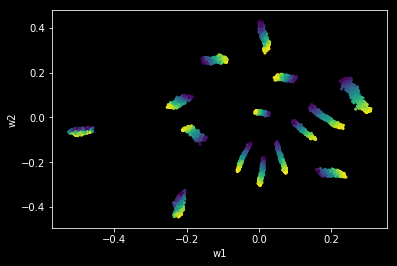

epoch: 6550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6550, rec_loss: 0.01554, kl_w: 0.00, kl_z: 4.83


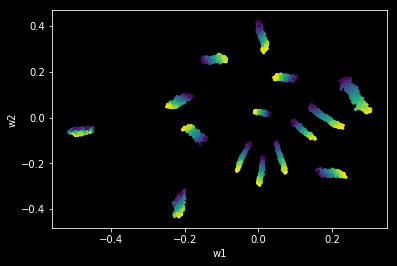

epoch: 6600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6600, rec_loss: 0.01540, kl_w: 0.00, kl_z: 4.76


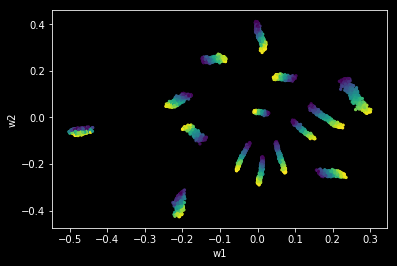

epoch: 6650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6650, rec_loss: 0.01527, kl_w: 0.00, kl_z: 4.69


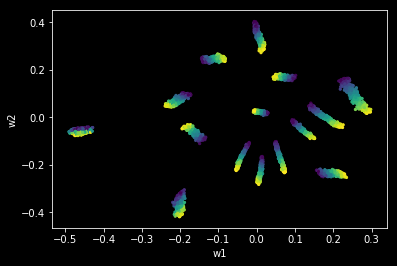

epoch: 6700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6700, rec_loss: 0.01515, kl_w: 0.00, kl_z: 4.63


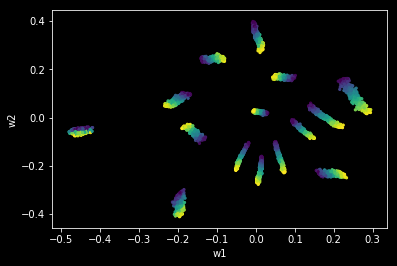

epoch: 6750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6750, rec_loss: 0.01500, kl_w: 0.00, kl_z: 4.61


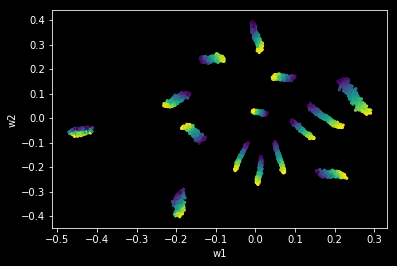

epoch: 6800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6800, rec_loss: 0.01491, kl_w: 0.00, kl_z: 4.55


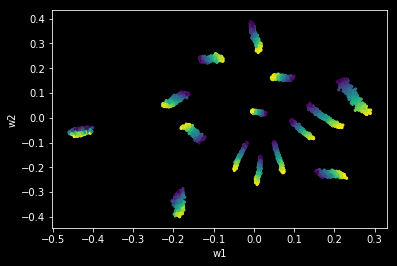

epoch: 6850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6850, rec_loss: 0.01503, kl_w: 0.00, kl_z: 4.50


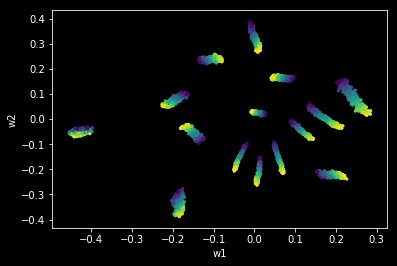

epoch: 6900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6900, rec_loss: 0.01487, kl_w: 0.00, kl_z: 4.47


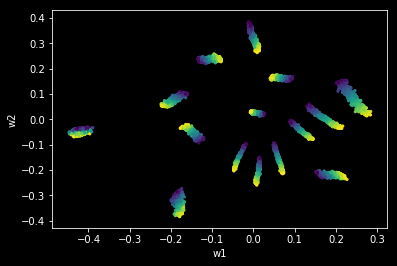

epoch: 6950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 6950, rec_loss: 0.01468, kl_w: 0.00, kl_z: 4.44


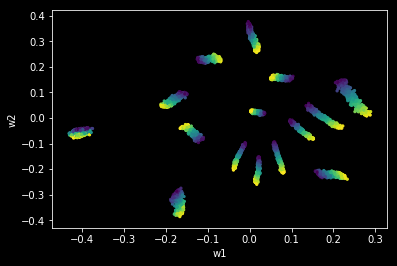

epoch: 7000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7000, rec_loss: 0.01746, kl_w: 0.00, kl_z: 4.41


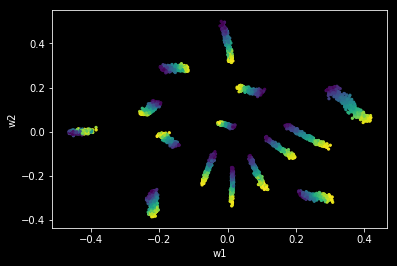

epoch: 7050, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7050, rec_loss: 0.01596, kl_w: 0.00, kl_z: 4.98


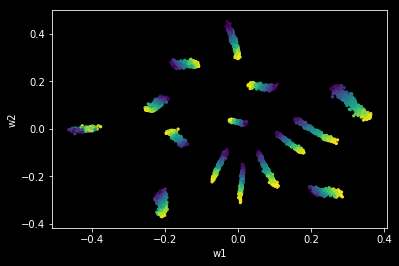

epoch: 7100, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7100, rec_loss: 0.01503, kl_w: 0.00, kl_z: 4.64


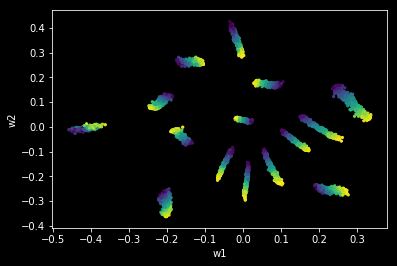

epoch: 7150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7150, rec_loss: 0.01477, kl_w: 0.00, kl_z: 4.51


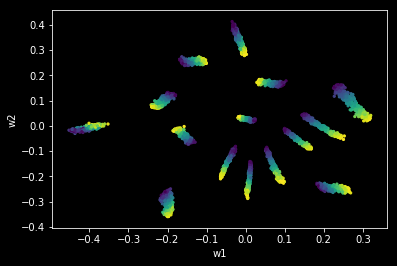

epoch: 7200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7200, rec_loss: 0.01461, kl_w: 0.00, kl_z: 4.48


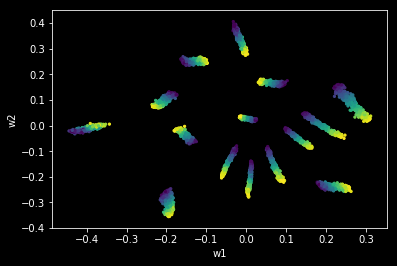

epoch: 7250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7250, rec_loss: 0.01450, kl_w: 0.00, kl_z: 4.43


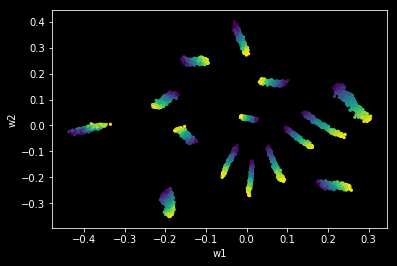

epoch: 7300, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7300, rec_loss: 0.01440, kl_w: 0.00, kl_z: 4.38


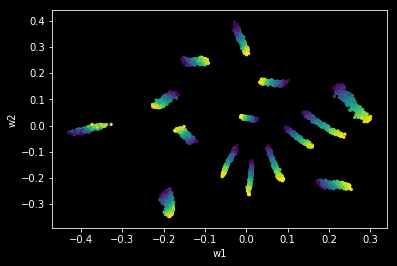

epoch: 7350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7350, rec_loss: 0.01432, kl_w: 0.00, kl_z: 4.36


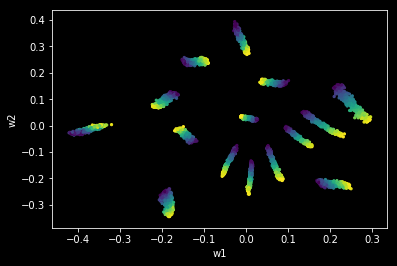

epoch: 7400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7400, rec_loss: 0.01423, kl_w: 0.00, kl_z: 4.33


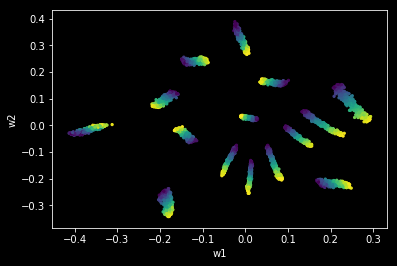

epoch: 7450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7450, rec_loss: 0.01420, kl_w: 0.00, kl_z: 4.29


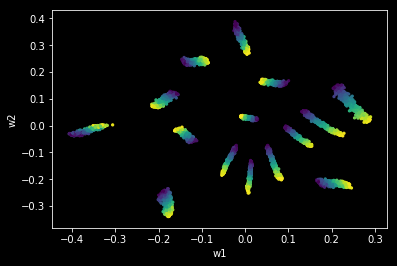

epoch: 7500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7500, rec_loss: 0.01405, kl_w: 0.00, kl_z: 4.30


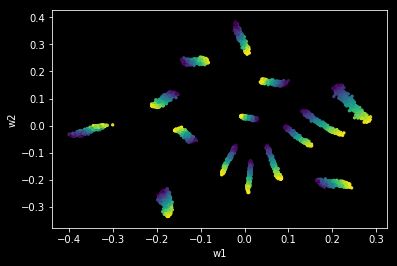

epoch: 7550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7550, rec_loss: 0.01398, kl_w: 0.00, kl_z: 4.28


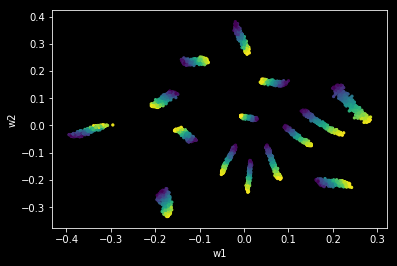

epoch: 7600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7600, rec_loss: 0.01391, kl_w: 0.00, kl_z: 4.27


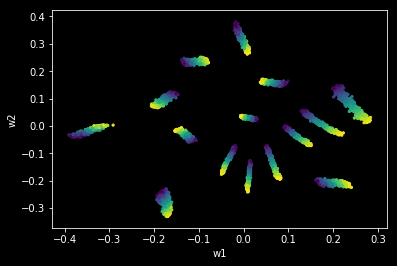

epoch: 7650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7650, rec_loss: 0.01384, kl_w: 0.00, kl_z: 4.25


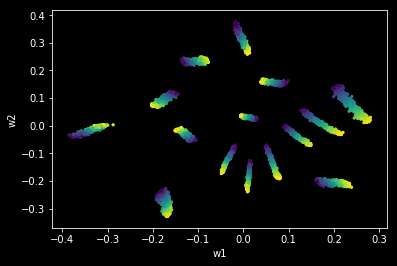

epoch: 7700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7700, rec_loss: 0.01379, kl_w: 0.00, kl_z: 4.23


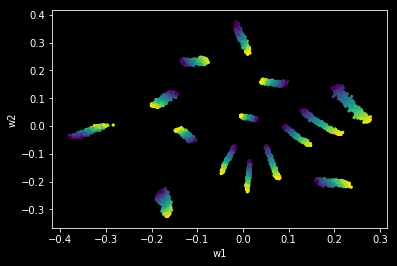

epoch: 7750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7750, rec_loss: 0.01372, kl_w: 0.00, kl_z: 4.22


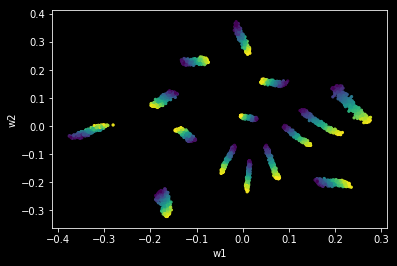

epoch: 7800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7800, rec_loss: 0.01366, kl_w: 0.00, kl_z: 4.20


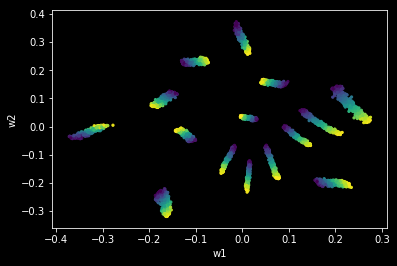

epoch: 7850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7850, rec_loss: 0.01359, kl_w: 0.00, kl_z: 4.19


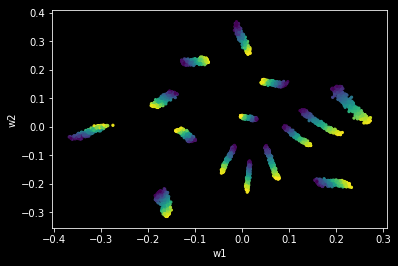

epoch: 7900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7900, rec_loss: 0.01354, kl_w: 0.00, kl_z: 4.17


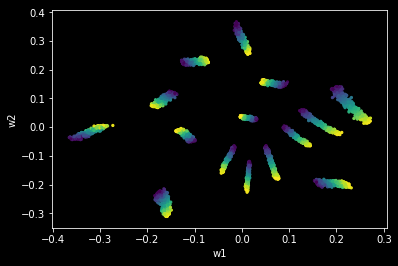

epoch: 7950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 7950, rec_loss: 0.01352, kl_w: 0.00, kl_z: 4.16


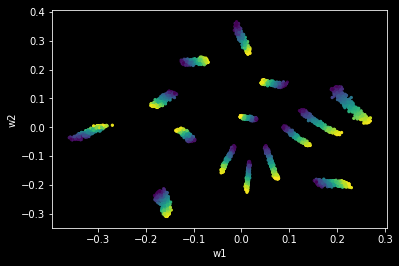

epoch: 8000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8000, rec_loss: 0.01346, kl_w: 0.00, kl_z: 4.15


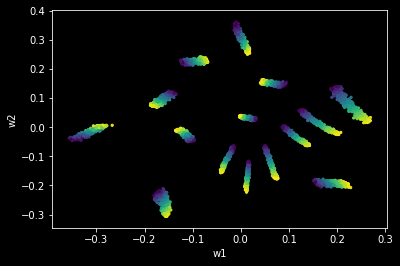

epoch: 8050, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8050, rec_loss: 0.01344, kl_w: 0.00, kl_z: 4.15


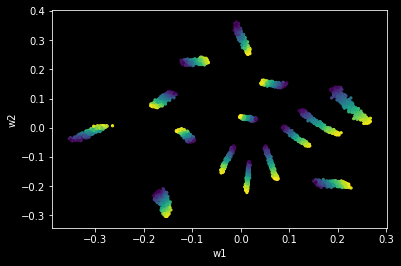

epoch: 8100, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8100, rec_loss: 0.01338, kl_w: 0.00, kl_z: 4.11


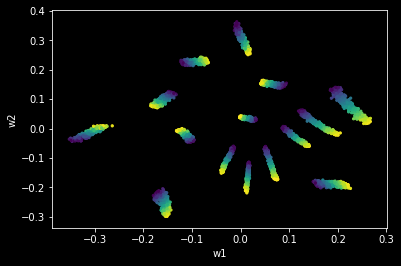

epoch: 8150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8150, rec_loss: 0.01338, kl_w: 0.00, kl_z: 4.12


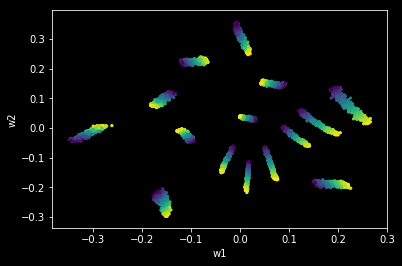

epoch: 8200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8200, rec_loss: 0.01335, kl_w: 0.00, kl_z: 4.11


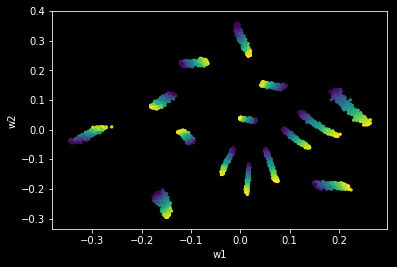

epoch: 8250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8250, rec_loss: 0.01339, kl_w: 0.00, kl_z: 4.09


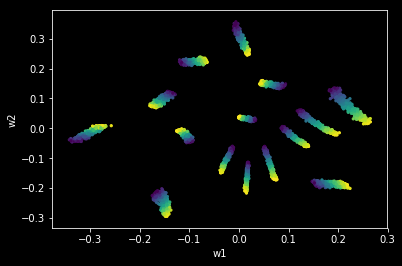

epoch: 8300, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8300, rec_loss: 0.01328, kl_w: 0.00, kl_z: 4.08


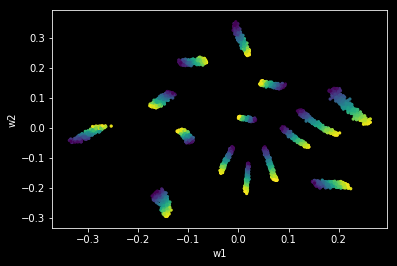

epoch: 8350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8350, rec_loss: 0.01402, kl_w: 0.00, kl_z: 4.08


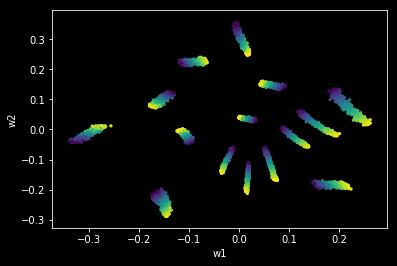

epoch: 8400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8400, rec_loss: 0.01322, kl_w: 0.00, kl_z: 4.06


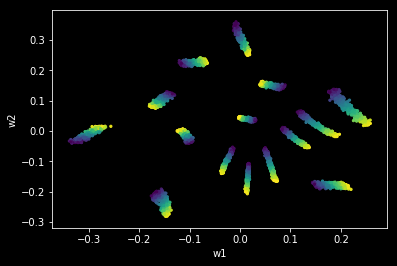

epoch: 8450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8450, rec_loss: 0.01390, kl_w: 0.00, kl_z: 4.05


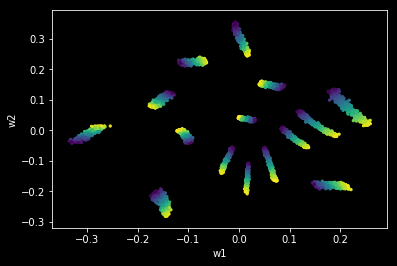

epoch: 8500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8500, rec_loss: 0.01339, kl_w: 0.00, kl_z: 4.04


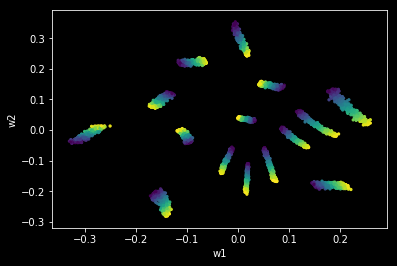

epoch: 8550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8550, rec_loss: 0.01323, kl_w: 0.00, kl_z: 4.03


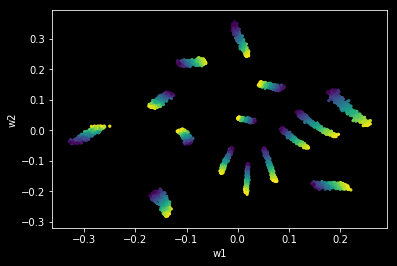

epoch: 8600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8600, rec_loss: 0.01314, kl_w: 0.00, kl_z: 4.02


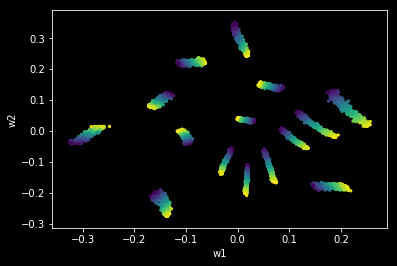

epoch: 8650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8650, rec_loss: 0.01337, kl_w: 0.00, kl_z: 4.02


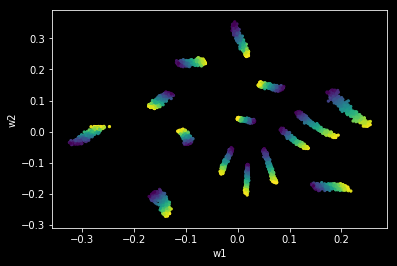

epoch: 8700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8700, rec_loss: 0.01339, kl_w: 0.00, kl_z: 4.01


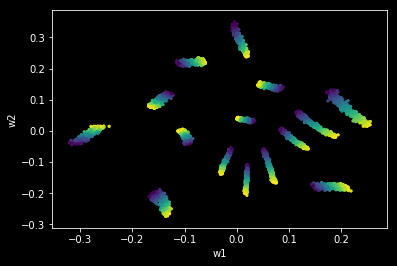

epoch: 8750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8750, rec_loss: 0.01305, kl_w: 0.00, kl_z: 4.00


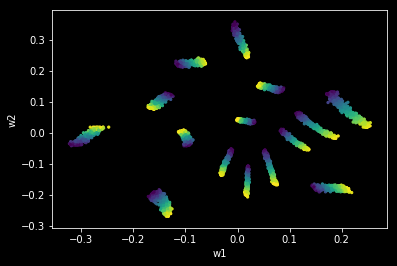

epoch: 8800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8800, rec_loss: 0.01321, kl_w: 0.00, kl_z: 3.98


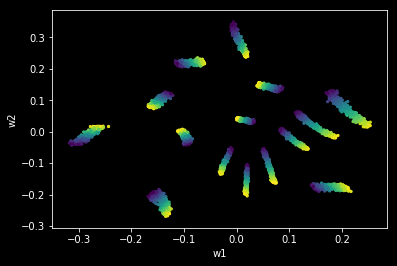

epoch: 8850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8850, rec_loss: 0.01313, kl_w: 0.00, kl_z: 4.00


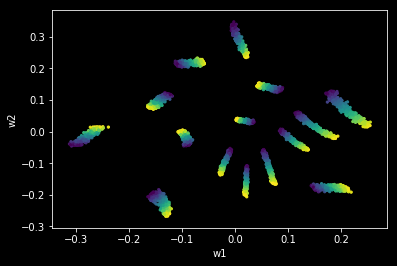

epoch: 8900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8900, rec_loss: 0.01331, kl_w: 0.00, kl_z: 3.97


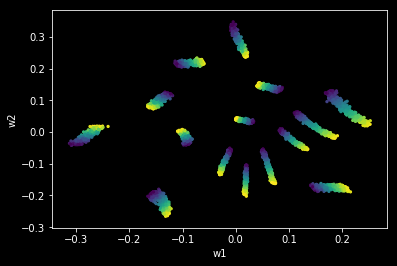

epoch: 8950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 8950, rec_loss: 0.01301, kl_w: 0.00, kl_z: 3.98


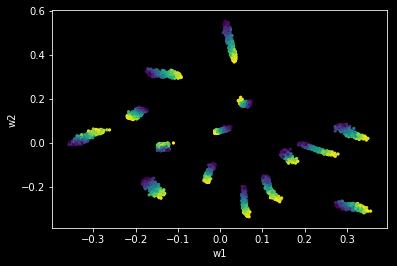

epoch: 9000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9000, rec_loss: 0.03046, kl_w: 0.00, kl_z: 4.34


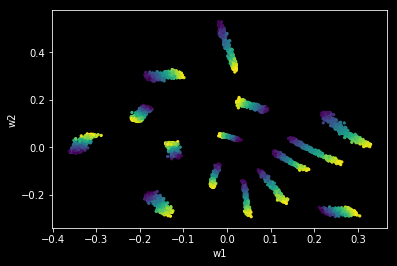

epoch: 9050, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9050, rec_loss: 0.01380, kl_w: 0.00, kl_z: 4.49


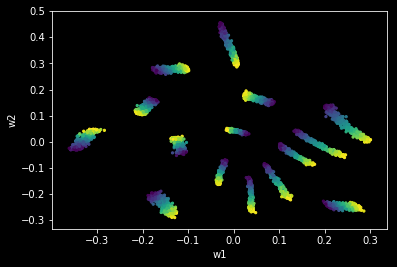

epoch: 9100, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9100, rec_loss: 0.01343, kl_w: 0.00, kl_z: 4.24


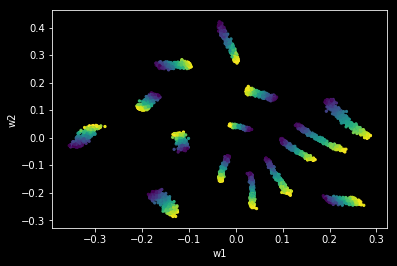

epoch: 9150, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9150, rec_loss: 0.01327, kl_w: 0.00, kl_z: 4.16


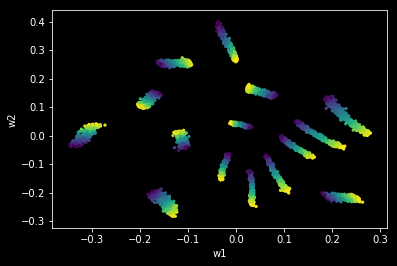

epoch: 9200, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9200, rec_loss: 0.01321, kl_w: 0.00, kl_z: 4.11


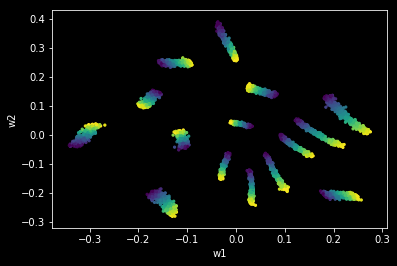

epoch: 9250, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9250, rec_loss: 0.01315, kl_w: 0.00, kl_z: 4.07


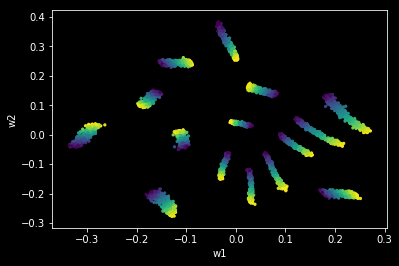

epoch: 9300, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9300, rec_loss: 0.01315, kl_w: 0.00, kl_z: 4.05


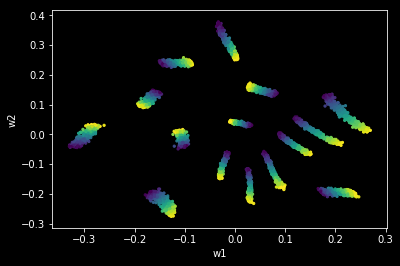

epoch: 9350, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9350, rec_loss: 0.01309, kl_w: 0.00, kl_z: 4.03


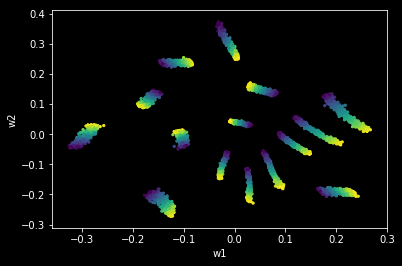

epoch: 9400, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9400, rec_loss: 0.01306, kl_w: 0.00, kl_z: 4.01


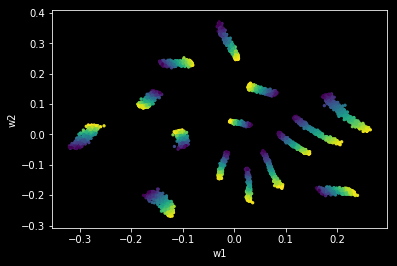

epoch: 9450, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9450, rec_loss: 0.01305, kl_w: 0.00, kl_z: 3.99


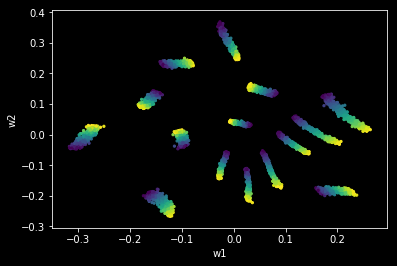

epoch: 9500, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9500, rec_loss: 0.01301, kl_w: 0.00, kl_z: 3.99


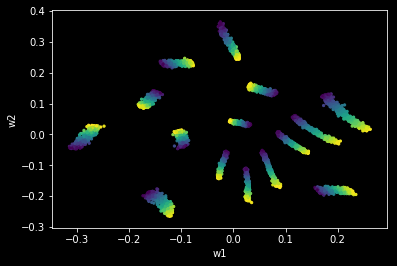

epoch: 9550, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9550, rec_loss: 0.01297, kl_w: 0.00, kl_z: 3.98


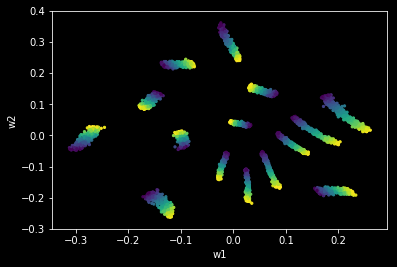

epoch: 9600, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9600, rec_loss: 0.01296, kl_w: 0.00, kl_z: 3.96


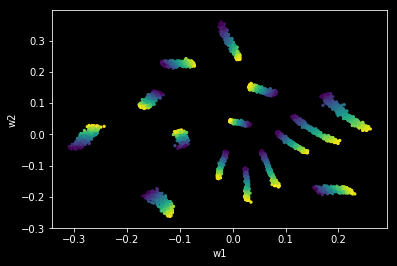

epoch: 9650, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9650, rec_loss: 0.01297, kl_w: 0.00, kl_z: 3.94


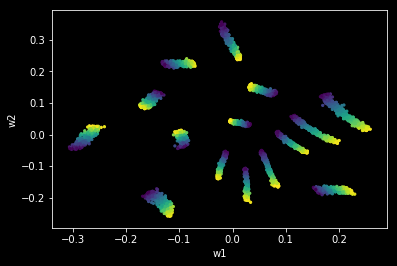

epoch: 9700, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9700, rec_loss: 0.01293, kl_w: 0.00, kl_z: 3.95


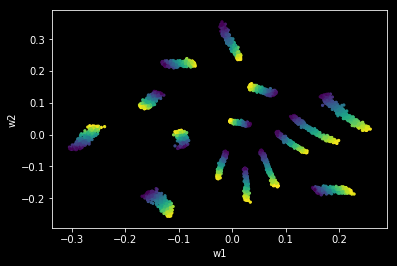

epoch: 9750, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9750, rec_loss: 0.01294, kl_w: 0.00, kl_z: 3.92


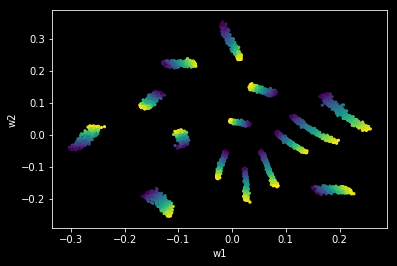

epoch: 9800, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9800, rec_loss: 0.01294, kl_w: 0.00, kl_z: 3.92


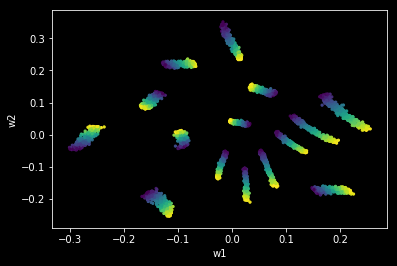

epoch: 9850, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9850, rec_loss: 0.01291, kl_w: 0.00, kl_z: 3.92


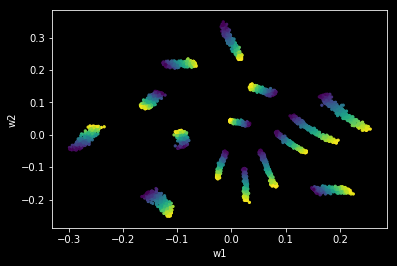

epoch: 9900, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9900, rec_loss: 0.01290, kl_w: 0.00, kl_z: 3.91


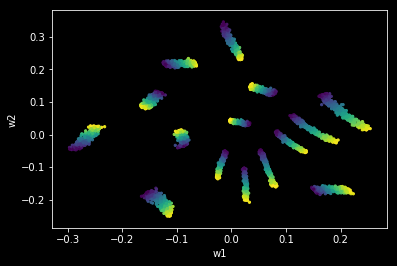

epoch: 9950, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 9950, rec_loss: 0.01287, kl_w: 0.00, kl_z: 3.92


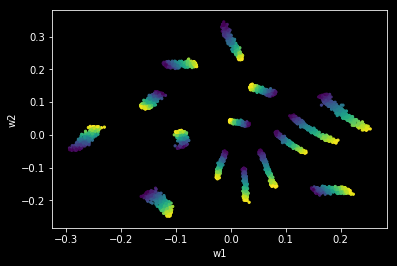

epoch: 10000, M_loss: 0.0, M1_loss: 0.0, M2_loss: 0.0, N_loss: 0.07
epoch: 10000, rec_loss: 0.01290, kl_w: 0.00, kl_z: 3.91


In [419]:
n_epochs = 10000
batch_size = X.shape[0]
start = time.time()
with tf.Session() as sess:
  sess.run(tf.global_variables_initializer())
  
  
  for i in range(n_epochs):
    gen = batch_generator(X, X, U, batch_size) #create batch generator
    M_loss = 0
    rec_loss_ = 0
    kl_z_ = 0
    
    for j in range(np.int(X.shape[0]/batch_size)):
      x_in_batch, x_out_batch, u_batch = gen.__next__()
      
      
      _, M_loss_, rec_loss__, kl_z__= sess.run([M_train, M_cost, rec_loss, kl_z], feed_dict={x_in: x_in_batch, x_out: x_out_batch, u_in: u_batch, training_phase:True})
      M_loss += M_loss_
      rec_loss_ += rec_loss__
      kl_z_ += kl_z__
      
    if (i+1)% 50 == 0 or i == 0:
      zIx_mean_, rec_out_= sess.run([zIx_mean, rec_out], feed_dict ={x_in:X, x_out:X, u_in:U, training_phase:False})
      end = time.time()
      plt.figure(2)
      plt.scatter(zIx_mean_[:,0],zIx_mean_[:,1], c=U[:,0], cmap='viridis', s=5.0);
      plt.xlabel('w1');
      plt.ylabel('w2');
      plt.show()
      print('epoch: {0}, M_loss: {1:.1f}, M1_loss: {2:.1f}, M2_loss: {3:.1f}, N_loss: {4:.2f}'.format((i+1), M_loss/(1+np.int(X.shape[0]/batch_size)), M1_/(1+np.int(X.shape[0]/batch_size)), M2_/(1+np.int(X.shape[0]/batch_size)), N_loss_/(1+np.int(X.shape[0]/batch_size))))
      print('epoch: {0}, rec_loss: {1:.5f}, kl_w: {2:.2f}, kl_z: {3:.2f}'.format((i+1), rec_loss_/(1+np.int(X.shape[0]/batch_size)), kl_w_/(1+np.int(X.shape[0]/batch_size)), kl_z_/(1+np.int(X.shape[0]/batch_size))))
      start = time.time()

Text(0.5, 0, 'z2')

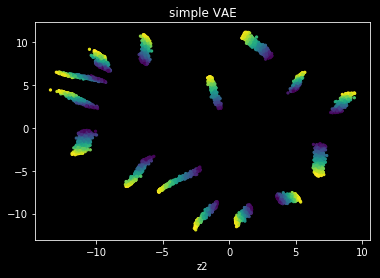

In [413]:
plt.scatter(zIx_mean_[:,0],zIx_mean_[:,1], c=U[:,0], cmap='viridis', s=5.0);
plt.title('simple VAE')
plt.xlabel('z1')
plt.xlabel('z2')